# Поиск изображения по запросу

## Задача проекта

 Разработать демонстрационную версию поиска изображений по запросу.

Для демонстрационной версии нужно обучить модель, которая получит векторное представление изображения, векторное представление текста, а на выходе выдаст число от 0 до 1 — покажет, насколько текст и картинка подходят друг другу.

## Описание данных

В файле `train_dataset.csv` находится информация, необходимая для обучения: имя файла изображения, идентификатор описания и текст описания. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `train_images` содержатся изображения для тренировки модели.

В файле `CrowdAnnotations.tsv` — данные по соответствию изображения и описания, полученные с помощью краудсорсинга. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.
3. Доля людей, подтвердивших, что описание соответствует изображению.
4. Количество человек, подтвердивших, что описание соответствует изображению.
5. Количество человек, подтвердивших, что описание не соответствует изображению.

В файле `ExpertAnnotations.tsv` содержатся данные по соответствию изображения и описания, полученные в результате опроса экспертов. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.

3, 4, 5 — оценки трёх экспертов.

Эксперты ставят оценки по шкале от 1 до 4, где 1 — изображение и запрос совершенно не соответствуют друг другу, 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует, 3 — запрос и текст соответствуют с точностью до некоторых деталей, 4 — запрос и текст соответствуют полностью.

В файле `test_queries.csv` находится информация, необходимая для тестирования: идентификатор запроса, текст запроса и релевантное изображение. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `test_images` содержатся изображения для тестирования модели.

# Знакомство с данными

In [43]:
# Импортируем необходимые библиотеки

import os
from typing import List, Tuple, Optional, Any, Dict, Union
import re
from urllib.request import urlretrieve
from zipfile import Path
import zipfile

from matplotlib import pyplot as plt
import numpy as np
import pandas as pd
from scipy.sparse import csr_matrix, hstack, issparse, vstack
from scipy.special import expit as sigmoid



import nltk
from nltk.stem import WordNetLemmatizer
from sklearn.feature_extraction.text import TfidfVectorizer
from gensim.models import Word2Vec
from gensim.utils import simple_preprocess
import gensim.downloader as api
from sentence_transformers import SentenceTransformer

from keras.src.optimizers import Adam
from keras.src.layers import Dense
from keras import Sequential, Input
from absl import logging
logging.set_verbosity(logging.ERROR)

from sklearn.base import BaseEstimator, clone
from sklearn.metrics import precision_score, recall_score
from sklearn.model_selection import GroupShuffleSplit
from sklearn.metrics import roc_auc_score
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import Normalizer

from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier

import tensorflow as tf
from tensorflow.keras import mixed_precision
from tensorflow.keras.applications.resnet import ResNet50, preprocess_input

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import Sequence as KerasSequence

os.environ["TRANSFORMERS_NO_TF"] = "1"

_has_gpu = len(tf.config.list_physical_devices("GPU")) > 0
if _has_gpu:
    try:
        mixed_precision.set_global_policy("mixed_float16")
    except Exception as e:
        print(f"[mixed_precision] не удалось включить: {e}")

import warnings
warnings.filterwarnings("ignore", category=UserWarning)

RANDOM_STATE = 42

In [44]:
def ensure_nltk_resources(
) -> None:
    """
    Проверяет наличие необходимых ресурсов NLTK и при их отсутствии скачивает их.

    Список ресурсов для проверки:
    - ("tokenizers/punkt", "punkt") — токенизатор предложений.
    - ("tokenizers/punkt_tab", "punkt_tab") — дополнительные таблицы для токенизации.
    - ("corpora/wordnet", "wordnet") — база WordNet (для лемматизации).
    - ("corpora/omw-1.4", "omw-1.4") — многоязычные словари для WordNet.

    Алгоритм:
    1. Для каждого ресурса проверяется наличие через nltk.data.find().
    2. Если ресурс отсутствует, запускается nltk.download().
    3. В случае успешной загрузки выводится сообщение "Загружен: {resource_name}".
       В случае ошибки выводится сообщение об ошибке.

    Возвращает
    ----------
    None
        Функция ничего не возвращает, но при необходимости загружает недостающие ресурсы.
    """
    to_check: List[Tuple[str, str]] = [
        ("tokenizers/punkt", "punkt"),
        ("tokenizers/punkt_tab", "punkt_tab"),
        ("corpora/wordnet", "wordnet"),
        ("corpora/omw-1.4", "omw-1.4"),
    ]
    for resource_path, resource_name in to_check:
        try:
            nltk.data.find(resource_path)
        except LookupError:
            try:
                nltk.download(resource_name, quiet=True)
                print(f"Загружен: {resource_name}")
            except Exception as e:
                print(f"Ошибка в загрузке {resource_name}: {e}")


In [45]:
# Загрузим NLTK

ensure_nltk_resources()

Загружен: wordnet
Загружен: omw-1.4


In [46]:
# Скачаем архив, распакуем, определим датасеты и папки с фото

url = "https://huggingface.co/datasets/onejetpilot/find_image/resolve/main/find_image.zip"

zip_path = "find_image.zip"

pth_train_dataset = "to_upload/train_dataset.csv"
pth_test_queries = "to_upload/test_queries.csv"
pth_crowd_annot = "to_upload/CrowdAnnotations.tsv"
pth_expert_annot = "to_upload/ExpertAnnotations.tsv"
pth_test_images_folder = "to_upload/test_images"
pth_train_images_folder = "to_upload/train_images"
pth_test_images = "to_upload/test_images.csv"

if not os.path.exists(zip_path):
    print("Скачиваю архив...")
    urlretrieve(url, zip_path)
    print("Архив скачан:", zip_path)
else:
    print("Архив уже есть:", zip_path)

need_extract = not all([
    os.path.exists(pth_train_dataset),
    os.path.exists(pth_test_queries),
    os.path.exists(pth_crowd_annot),
    os.path.exists(pth_expert_annot),
    os.path.exists(pth_test_images),
    os.path.isdir(pth_test_images_folder),
    os.path.isdir(pth_train_images_folder),
])

if need_extract:
    print("Распаковываю архив в:", zip_path)
    with zipfile.ZipFile(zip_path, 'r') as zf:
        zf.extractall(".")
    print("Готово.")
else:
    print("Файлы уже распакованы - пропускаю распаковку.")

if os.path.exists(pth_train_dataset):
    train_dataset = pd.read_csv(pth_train_dataset, sep=',')
    test_queries = pd.read_csv(pth_test_queries, sep='|', index_col=0)
    crowd_annot = pd.read_csv(pth_crowd_annot, sep='\t', header=None)
    expert_annot = pd.read_csv(pth_expert_annot, sep='\t', header=None)
    test_images = pd.read_csv(pth_test_images, sep='|')

    print("Данные загружены:")
    print(" - train_dataset:", train_dataset.shape)
    print(" - test_queries:", test_queries.shape)
    print(" - crowd_annot:", crowd_annot.shape)
    print(" - expert_annot:", expert_annot.shape)
    print(" - test_images:", test_images.shape)
    print("Папки с изображениями:",
          "train_images =", os.path.isdir(pth_train_images_folder),
          ", test_images =", os.path.isdir(pth_test_images_folder))
else:
    print("Файлы не найдены после распаковки - проверьте содержимое архива.")

Архив уже есть: find_image.zip
Файлы уже распакованы - пропускаю распаковку.
Данные загружены:
 - train_dataset: (5822, 3)
 - test_queries: (500, 3)
 - crowd_annot: (47830, 5)
 - expert_annot: (5822, 5)
 - test_images: (100, 1)
Папки с изображениями: train_images = True , test_images = True


In [47]:
# Создадим список с пропущенными именами колонок в CrowdAnnotations и ExpertAnnotations

missed_names_expert = ['image', 'query_id', 'rate_1', 'rate_2', 'rate_3']
missed_names_crowd = ['image', 'query_id', 'share_confirmed', 'count_confirmed', 'count_rejected']

In [48]:
# Добавим имена колонок

crowd_annot.columns = missed_names_crowd
expert_annot.columns = missed_names_expert

In [49]:
def overview_data(
        data: pd.DataFrame
) -> None:
    """
    Выводит информацию о DataFrame - типы данных,
    статистику, количество пропусков и дубликатов

    Параметры
    ----------
    data : pandas.DataFrame
        Таблица данных, для которой требуется провести обзор

    Возвращает
    ----------
    None
        Функция выводит информацию
    """

    d = '-' * 50

    print(d)
    print('Инфо')
    print(d)
    data.info()
    print('\n')

    print(d)
    print('Статистика')
    print(d)
    data.describe()
    print('\n')

    print(d)
    print('Пропуски')
    print(d)
    print(data.isna().sum())
    print('\n')

    print(d)
    print('Дубликаты')
    print(d)
    print(data.duplicated().sum())
    print('\n')

    print(d)
    print('Нулевые значения')
    print(d)
    print((data == 0).sum())
    print('\n')

In [50]:
# Посмотрим на датасет train_dataset

overview_data(train_dataset)

--------------------------------------------------
Инфо
--------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
dtypes: object(3)
memory usage: 136.6+ KB


--------------------------------------------------
Статистика
--------------------------------------------------


--------------------------------------------------
Пропуски
--------------------------------------------------
image         0
query_id      0
query_text    0
dtype: int64


--------------------------------------------------
Дубликаты
--------------------------------------------------
0


--------------------------------------------------
Нулевые значения
--------------------------------------------------
image         0
que

In [51]:
train_dataset.head()

,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...


In [52]:
# Посмотрим на датасет test_queries

overview_data(test_queries)

--------------------------------------------------
Инфо
--------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
Index: 500 entries, 0 to 499
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   query_id    500 non-null    object
 1   query_text  500 non-null    object
 2   image       500 non-null    object
dtypes: object(3)
memory usage: 15.6+ KB


--------------------------------------------------
Статистика
--------------------------------------------------


--------------------------------------------------
Пропуски
--------------------------------------------------
query_id      0
query_text    0
image         0
dtype: int64


--------------------------------------------------
Дубликаты
--------------------------------------------------
0


--------------------------------------------------
Нулевые значения
--------------------------------------------------
query_id      0
query_text 

In [53]:
test_queries.head()

,query_id,query_text,image
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg
3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at eac...,1177994172_10d143cb8d.jpg
4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each oth...,1177994172_10d143cb8d.jpg


In [54]:
# Посмотрим датасет с оценками от краудсорсинга

overview_data(crowd_annot)

--------------------------------------------------
Инфо
--------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47830 entries, 0 to 47829
Data columns (total 5 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   image            47830 non-null  object 
 1   query_id         47830 non-null  object 
 2   share_confirmed  47830 non-null  float64
 3   count_confirmed  47830 non-null  int64  
 4   count_rejected   47830 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 1.8+ MB


--------------------------------------------------
Статистика
--------------------------------------------------


--------------------------------------------------
Пропуски
--------------------------------------------------
image              0
query_id           0
share_confirmed    0
count_confirmed    0
count_rejected     0
dtype: int64


--------------------------------------------------
Ду

In [55]:
crowd_annot.head()

,image,query_id,share_confirmed,count_confirmed,count_rejected
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0,0,3
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0,0,3
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.0,0,3
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.0,0,3


In [56]:
# Посмотрим датасет с оценками экспертов

overview_data(expert_annot)

--------------------------------------------------
Инфо
--------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   image     5822 non-null   object
 1   query_id  5822 non-null   object
 2   rate_1    5822 non-null   int64 
 3   rate_2    5822 non-null   int64 
 4   rate_3    5822 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 227.5+ KB


--------------------------------------------------
Статистика
--------------------------------------------------


--------------------------------------------------
Пропуски
--------------------------------------------------
image       0
query_id    0
rate_1      0
rate_2      0
rate_3      0
dtype: int64


--------------------------------------------------
Дубликаты
--------------------------------------------------
0


----------------------------------------

In [57]:
expert_annot.head()

,image,query_id,rate_1,rate_2,rate_3
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2


In [58]:
# Посмотрим на датасет с тестовыми фотографиями

overview_data(test_images)

--------------------------------------------------
Инфо
--------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   100 non-null    object
dtypes: object(1)
memory usage: 928.0+ bytes


--------------------------------------------------
Статистика
--------------------------------------------------


--------------------------------------------------
Пропуски
--------------------------------------------------
image    0
dtype: int64


--------------------------------------------------
Дубликаты
--------------------------------------------------
0


--------------------------------------------------
Нулевые значения
--------------------------------------------------
image    0
dtype: int64




In [59]:
test_images.head()

,image
0,3356748019_2251399314.jpg
1,2887171449_f54a2b9f39.jpg
2,3089107423_81a24eaf18.jpg
3,1429546659_44cb09cbe2.jpg
4,1177994172_10d143cb8d.jpg


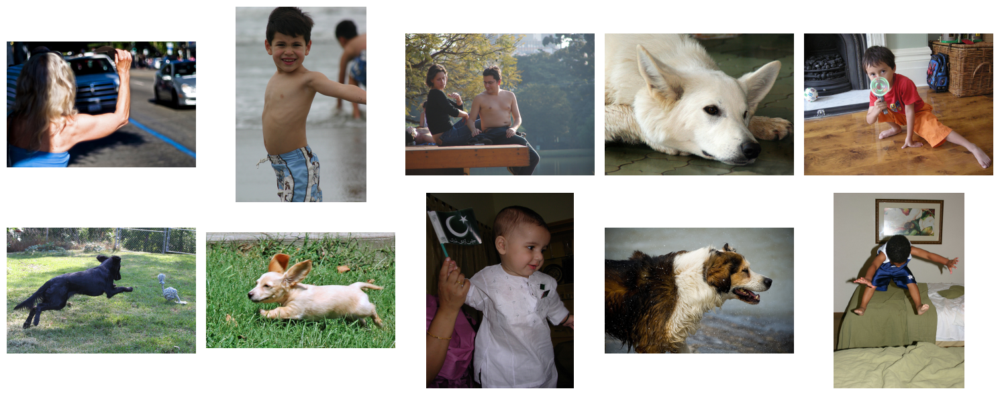

In [60]:
# Посмотрим на фото в тренировочном датасете

files_train = sorted(os.listdir(pth_train_images_folder))[:10]

plt.figure(figsize=(15, 6))
for i, fname in enumerate(files_train):
    img = plt.imread(os.path.join(pth_train_images_folder, fname))
    plt.subplot(2, 5, i+1)
    plt.imshow(img)
    plt.axis("off")
plt.tight_layout()
plt.show()

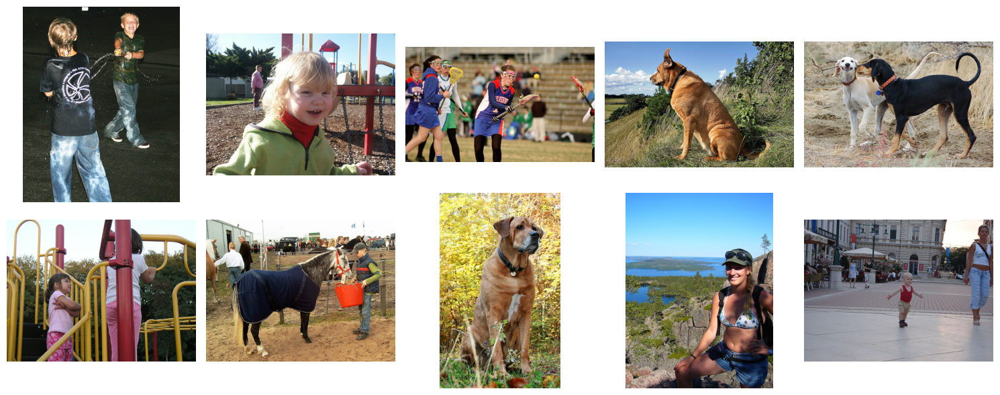

In [61]:
# Фото в тестовом датасете

files_test = sorted(os.listdir(pth_test_images_folder))[:10]

plt.figure(figsize=(15, 6))
for i, fname in enumerate(files_test):
    img = plt.imread(os.path.join(pth_test_images_folder, fname))
    plt.subplot(2, 5, i+1)
    plt.imshow(img)
    plt.axis("off")
plt.tight_layout()
plt.show()

In [62]:
# Посмотрим на количество изображений в обучающей и тестовой выборке

def files_count(folder_path: str) -> int:
    files = [f for f in os.listdir(folder_path)]
    return len(files)

print(f"Количество фото в обучающей выборке выборке: {files_count(pth_train_images_folder)}")
print(f"Количество фото в тестовой выборке: {files_count(pth_test_images_folder)}")

Количество фото в обучающей выборке выборке: 1000
Количество фото в тестовой выборке: 100


## Вывод

- Загрузили данные и посмотрели информацию о датасетах
- Нашли пропущенные значения в столбцах share_confirmed - 41970, count_confirmed - 41970, count_rejected - 1323
- Дубликатов нет
- Пропусков в других датасетах нет
- Посмотрели на фотографии тренировочной и тестовой выборки

# Исследовательский анализ данных

Наш датасет содержит экспертные и краудсорсинговые оценки соответствия текста и изображения.

В файле с экспертными мнениями для каждой пары изображение-текст имеются оценки от трёх специалистов. Для решения задачи вы должны эти оценки агрегировать — превратить в одну. Существует несколько способов агрегации оценок, самый простой — голосование большинства: за какую оценку проголосовала большая часть экспертов (в нашем случае 2 или 3), та оценка и ставится как итоговая. Поскольку число экспертов меньше числа классов, может случиться, что каждый эксперт поставит разные оценки, например: 1, 4, 2. В таком случае данную пару изображение-текст можно исключить из датасета.

Вы можете воспользоваться другим методом агрегации оценок или придумать свой.

В файле с краудсорсинговыми оценками информация расположена в таком порядке:

1. Доля исполнителей, подтвердивших, что текст **соответствует** картинке.
2. Количество исполнителей, подтвердивших, что текст **соответствует** картинке.
3. Количество исполнителей, подтвердивших, что текст **не соответствует** картинке.

После анализа экспертных и краудсорсинговых оценок выберите либо одну из них, либо объедините их в одну по какому-то критерию: например, оценка эксперта принимается с коэффициентом 0.6, а крауда — с коэффициентом 0.4.

Ваша модель должна возвращать на выходе вероятность соответствия изображения тексту, поэтому целевая переменная должна иметь значения от 0 до 1.


## Оценки экспертов


Распределение rate_1:
rate_1
1    4120
2    1109
3     346
4     247
Name: count, dtype: int64


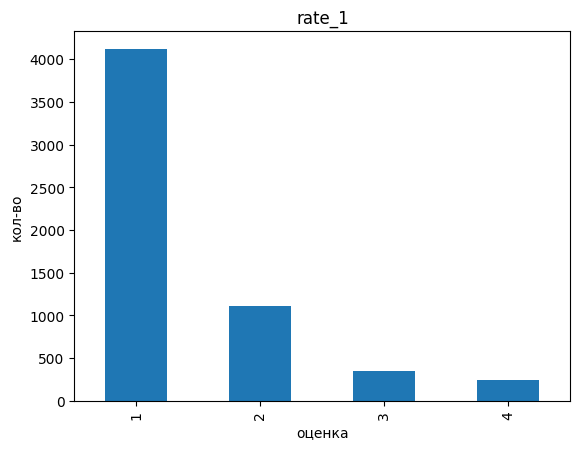


Распределение rate_2:
rate_2
1    3327
2    1666
3     518
4     311
Name: count, dtype: int64


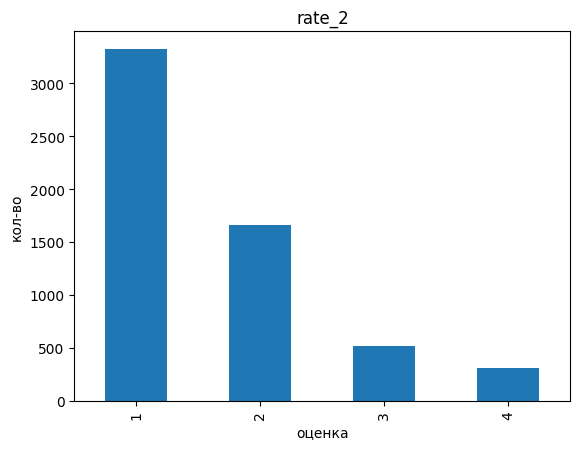


Распределение rate_3:
rate_3
1    2350
2    2222
3     837
4     413
Name: count, dtype: int64


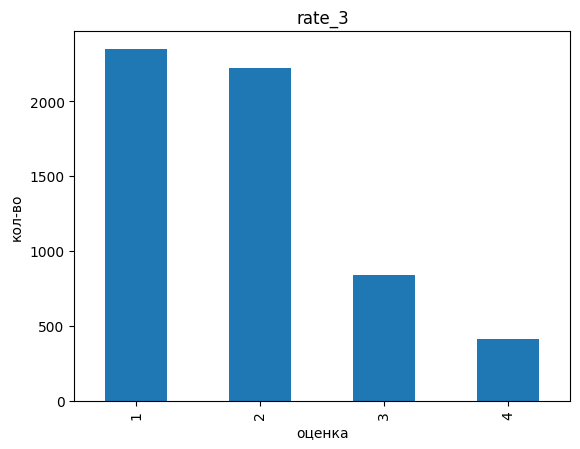

In [63]:
# Посмотрим распределение оценок экспертов

for col in ["rate_1","rate_2","rate_3"]:
    vc = expert_annot[col].value_counts().sort_index()
    print(f"\nРаспределение {col}:\n{vc}")
    vc.plot(kind="bar", title=col)
    plt.xlabel("оценка")
    plt.ylabel("кол-во")
    plt.show()

Судя по гистограммам распределений:

- Эксперт 1 (rate_1): почти всегда ставит оценку 1 (более 4000 раз), заметно реже 2, совсем редко 3–4
- Эксперт 2 (rate_2): тоже чаще всего ставит 1, но чаще использует 2 и чуть больше разброс по 3–4
- Эксперт 3 (rate_3): распределение более сбалансированное: много 1 и 2, есть приличное число 3, а также 4

In [64]:
# Соберем все оценки экспертов

all_rates = pd.concat([expert_annot["rate_1"],
                       expert_annot["rate_2"],
                       expert_annot["rate_3"]])

In [65]:
# Посчитаем частоты

counts = all_rates.value_counts().sort_index()

print("\nРаспределение всех оценок экспертов:")
print(counts)


Распределение всех оценок экспертов:
1    9797
2    4997
3    1701
4     971
Name: count, dtype: int64


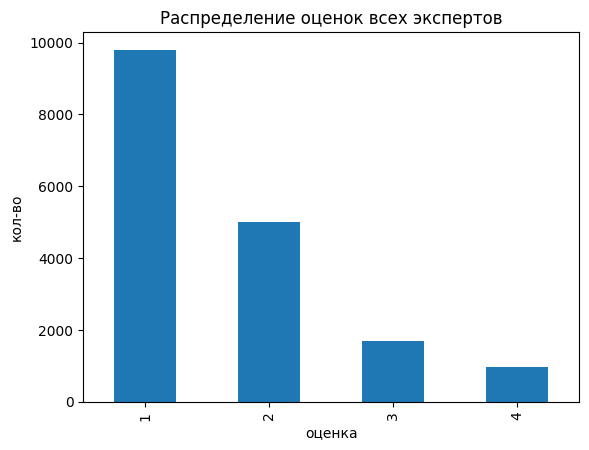

In [66]:
# Посмотрим распределение оценок всех экспертов

counts.plot(kind="bar")
plt.title("Распределение оценок всех экспертов")
plt.xlabel("оценка")
plt.ylabel("кол-во")
plt.show()

Эксперты чаще всего считают, что запрос соответствует изображению. По оценкам экспертов явно виден дисбаланс классов.

In [67]:
def majority_vote(
        row: pd.Series
) -> int:
    """
    Определяет общее решение экспертов по трём оценкам.

    Параметры
    ----------
    row : pd.Series
        Строка датафрейма, в которой должны быть поля 'rate_1', 'rate_2', 'rate_3'.

    Возвращает
    ----------
    int | float | np.nan
        Значение оценки, за которую проголосовало большинство экспертов:
        - если 2 или 3 эксперта дали одинаковую оценку → возвращается эта оценка
        - если все три оценки разные → возвращается np.nan
    """
    a, b, c = row["rate_1"], row["rate_2"], row["rate_3"]
    vals = [a, b, c]
    for v in set(vals):
        if vals.count(v) >= 2:
            return v
    return np.nan

In [68]:
def agreement_type(
        row: pd.Series
) -> str:
    """
    Определяет тип согласия между тремя экспертами по их оценкам.

    Параметры
    ----------
    row : pd.Series
        Строка датафрейма, содержащая три оценки: 'rate_1', 'rate_2', 'rate_3'.

    Возвращает
    ----------
    str
        Категория согласия:
        - "Все одинаковые" : все три эксперта поставили одинаковую оценку
        - "Две из трех"    : совпадают оценки двух экспертов из трёх
        - "Все разные"     : все оценки различаются
    """
    a, b, c = row["rate_1"], row["rate_2"], row["rate_3"]
    if a == b == c:
        return "Все одинаковые"
    if (a == b) or (a == c) or (b == c):
        return "Две из трех"
    return "Все разные"

In [69]:
# Применим функции к экспретным оценкам

exp = expert_annot.copy()
exp["exp_majority"] = exp.apply(majority_vote, axis=1)
exp["agreement"]    = exp.apply(agreement_type, axis=1)

In [70]:
# Выведем доли типов согласия

print(exp["agreement"].value_counts(normalize=True).round(3))

agreement
Все одинаковые    0.582
Две из трех       0.396
Все разные        0.022
Name: proportion, dtype: float64


- В примерно 58 % случаев все трое экспертов полностью согласны
- Почти в 40% случаев мнение одного эксперта расходится с мнением большинства
- Лишь около 2 % примеров, где все трое выбрали разные значения. Эти случаю лучше исключить или заменить на крауд

## Оценки крауда

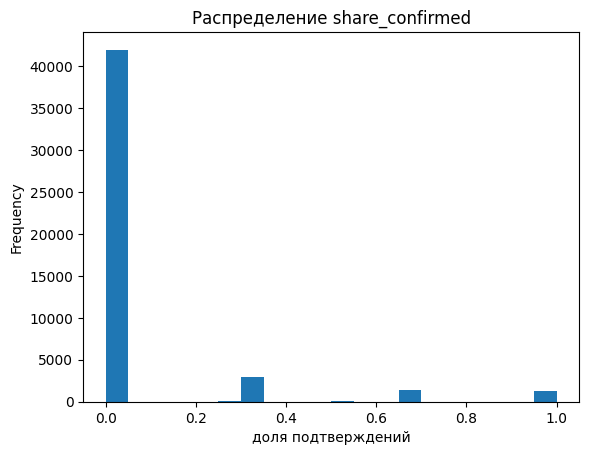

In [71]:
# Посмотрим распределение оценок крауда

crowd_annot["share_confirmed"].plot(kind="hist", bins=20, title="Распределение share_confirmed")
plt.xlabel("доля подтверждений")
plt.show()

Подавляющее большинство оценок — отрицательные. Для обучения можно взять только надёжные метки:
- share_confirmed ≥ 0.8 соответствие
- share_confirmed ≤ 0.2 несоответствие

### Запросы

In [72]:
# Удалим дубликаты из запросов

queries = train_dataset.drop_duplicates("query_text")

In [73]:
# Посчитаем длину в символах и в словах

queries["len_chars"] = queries["query_text"].fillna("").str.len()
queries["len_tokens"] = queries["query_text"].fillna("").str.split().str.len()

/tmp/ipykernel_7005/3257013185.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  queries["len_chars"] = queries["query_text"].fillna("").str.len()
/tmp/ipykernel_7005/3257013185.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  queries["len_tokens"] = queries["query_text"].fillna("").str.split().str.len()


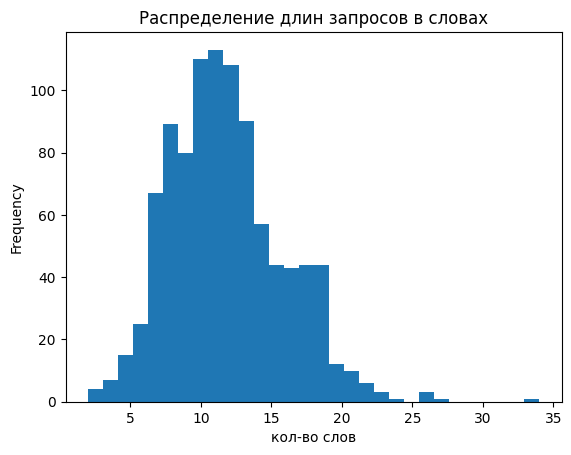

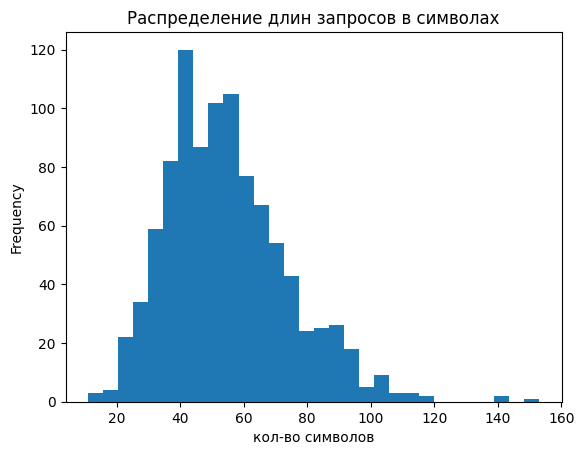

In [74]:
# Выведем гистограммы по длине запросов в тренировочной выборке

queries["len_tokens"].plot(kind="hist", bins=30, title="Распределение длин запросов в словах")
plt.xlabel("кол-во слов"); plt.show()

queries["len_chars"].plot(kind="hist", bins=30, title="Распределение длин запросов в символах")
plt.xlabel("кол-во символов"); plt.show()

Судя по гистограммам:

По словам:

- Большая часть запросов лежит в диапазоне 8–15 слов
- Пик — около 10–12 слов
- Есть редкие длинные запросы (до 30+ слов), но это скорее аномалии

По символам:

- Большая часть - 40–70 символов
- Пик — примерно на 45–55 символах
- Если запросы до 150 символов (редкие длинные формулировки)

In [75]:
# Отфильтруем запросы по длине, посмотрим на самые большие запросы

long_words = queries[queries["len_tokens"] > 25]
long_chars = queries[queries["len_chars"] > 120]

In [76]:
# По количеству слов

long_words[["query_text", "len_tokens", "len_chars"]].head(20)

,query_text,len_tokens,len_chars
549,A smiling boy in an orange shirt with a safari...,26,114
1888,A girl in a black outfit with a red sash and a...,26,119
2152,Two men are talking on the street ; one is poi...,34,153
2986,"A man with dark glasses , a black jacket , and...",26,142
5249,A man wearing black boxing shorts and white bo...,27,141


In [77]:
# По количеству символов

long_chars[["query_text", "len_tokens", "len_chars"]].head(20)

,query_text,len_tokens,len_chars
2152,Two men are talking on the street ; one is poi...,34,153
2986,"A man with dark glasses , a black jacket , and...",26,142
5249,A man wearing black boxing shorts and white bo...,27,141


Если посмотреть на то, что получилось то большие запросы это запросы с лишней информацией - описанием полос футболки, того что говорит человек на изображении и т.д. Думаю мы можем просто удалить эти запросы т.к. их всего 5.

## Вывод

- В качестве финальных меток целесообразно использовать голосование экспертов, дополняя краудом для спорных случаев или отсутствующих экспертных оценок
- Исключить примеры с полным расхождением экспертов и сомнительные крауд-аннотации (0.2–0.8)
- 5 длинных запросов удаляем совсем
- Анализ показал сильный дисбаланс классов и принадлежность оценок в основном к 0 или 1, поэтому для дальнейшей работы мы сведем задачу к бинарной классификации

# Предобработка

## Очистка тренировочного датасета

In [78]:
# Считаем количество слов

train_dataset["len_tokens"] = train_dataset["query_text"].fillna("").str.split().str.len()

In [79]:
# Фильтруем только запросы длиной <= 25 слов

train_dataset = train_dataset[train_dataset["len_tokens"] <= 25].copy()

In [80]:
# Удаляем вспомогательную колонку

train_dataset = train_dataset.drop(columns=["len_tokens"])

## Очистка крауда

In [81]:
# Удаляем сомнительные оценки из крауд

crowd_annot = crowd_annot[
    (crowd_annot["share_confirmed"] <= 0.2) |
    (crowd_annot["share_confirmed"] >= 0.8)
].copy()

## Объединение и агрегация оценок

In [82]:
# Объединим датасеты с оценками экспертов и крауда

merged_annot = pd.merge(expert_annot, crowd_annot, on=['query_id', 'image'], how='outer')

In [83]:
# Посмотрим на получившийся после объединения датасет, cтолбцы count_confirmed и count_rejected удалим

merged_annot = merged_annot.drop(columns=['count_confirmed', 'count_rejected'])
merged_annot.head()

,image,query_id,rate_1,rate_2,rate_3,share_confirmed
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,NaN,NaN,NaN,1.0
1,2182488373_df73c7cc09.jpg,1056338697_4f7d7ce270.jpg#2,NaN,NaN,NaN,0.0
2,2594042571_2e4666507e.jpg,1056338697_4f7d7ce270.jpg#2,NaN,NaN,NaN,0.0
3,2647049174_0fb47cee2e.jpg,1056338697_4f7d7ce270.jpg#2,1.0,1.0,1.0,NaN
4,2843695880_eeea6c67db.jpg,1056338697_4f7d7ce270.jpg#2,NaN,NaN,NaN,0.0


Агрегировать оценки будем по следующим правилам
   - Экспертные оценки нормализуются делением на scale.
   - Если есть большинство у экспертов, берётся взвешенная комбинация
      (weight_expert * expert + weight_crowd * crowd), при отсутствии крауда — только эксперт.
   - Если все экспертные оценки различны, используется только крауд-оценка.
   - Если отсутствуют и эксперты, и крауд, результатом будет NaN.

In [84]:
def target_score(
    df: pd.DataFrame,
    weight_expert: float = 0.6,
    weight_crowd: float = 0.4,
    scale: int = 4
) -> pd.DataFrame:
    """
    Нормализует экспертные оценки и агрегирует их с крауд-оценкой
    в единую целевую метку `target`.

    Параметры
    ----------
    df : pandas.DataFrame
        Таблица с колонками 'rate_1', 'rate_2', 'rate_3' (экспертные оценки)
        и 'share_confirmed' (доля подтверждений краудсорсинга).
    weight_expert : float, по умолчанию 0.6
        Вес экспертной оценки при наличии большинства экспертов.
    weight_crowd : float, по умолчанию 0.4
        Вес крауд-оценки при наличии большинства экспертов.
    scale : int, по умолчанию 4
        Делитель для нормализации экспертных оценок в диапазон [0, 1].

    Возвращает
    ----------
    pandas.DataFrame
        Копия входного датафрейма с добавленной колонкой 'target' и
        удалёнными колонками 'rate_1', 'rate_2', 'rate_3', 'share_confirmed'.
    """
    df = df.copy()
    expert_cols = ["rate_1", "rate_2", "rate_3"]
    df[expert_cols] = df[expert_cols] / scale

    def get_target(row):
        votes = [v for v in row[expert_cols] if pd.notna(v)]
        crowd = row["share_confirmed"]

        if len(votes) == 0:
            return crowd

        counts = pd.Series(votes).value_counts()

        if counts.iloc[0] > 1:
            expert_vote = counts.index[0]
            if pd.isna(crowd):
                return expert_vote
            return weight_expert * expert_vote + weight_crowd * crowd
        else:
            return crowd

    df["target"] = df.apply(get_target, axis=1)
    df = df.drop(columns=["rate_1", "rate_2", "rate_3", "share_confirmed"])
    return df

In [85]:
%%time
# Вызовем функцию агрегации

df_scores = target_score(merged_annot)

CPU times: user 9.11 s, sys: 0 ns, total: 9.11 s
Wall time: 9.11 s


In [86]:
# Посмотрим на получившийся датасет

overview_data(df_scores)

--------------------------------------------------
Инфо
--------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47244 entries, 0 to 47243
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   image     47244 non-null  object 
 1   query_id  47244 non-null  object 
 2   target    47169 non-null  float64
dtypes: float64(1), object(2)
memory usage: 1.1+ MB


--------------------------------------------------
Статистика
--------------------------------------------------


--------------------------------------------------
Пропуски
--------------------------------------------------
image        0
query_id     0
target      75
dtype: int64


--------------------------------------------------
Дубликаты
--------------------------------------------------
0


--------------------------------------------------
Нулевые значения
--------------------------------------------------
image          

В таргете есть 55 пропусков.

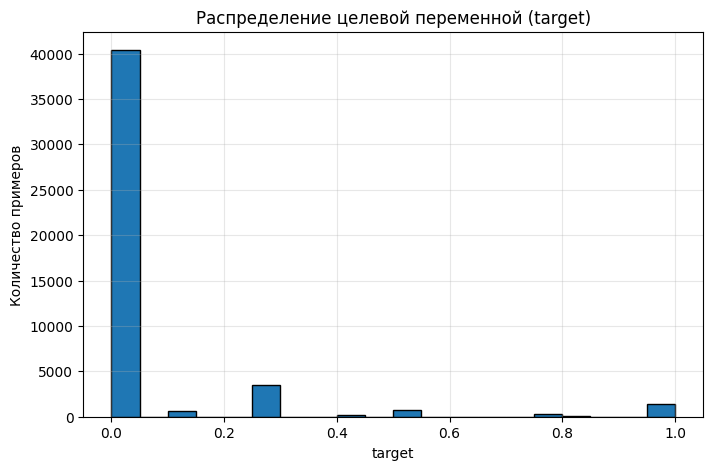

In [87]:
# Построим график распределения оценок

plt.figure(figsize=(8, 5))
plt.hist(df_scores['target'].dropna(), bins=20, edgecolor="black")
plt.title("Распределение целевой переменной (target)")
plt.xlabel("target")
plt.ylabel("Количество примеров")
plt.grid(True, alpha=0.3)
plt.show()


Как можно увидеть по графику, у нас в основном нулевые оценки, то есть у нас сильный дисбаланс классов.

## Объединение оценок с трейном

In [88]:
# Объединим тренировочный датасет с датасетом оценок

train_df = pd.merge(df_scores, train_dataset, on=['query_id', 'image'], how='outer')

In [89]:
# Посмотрим информацию

overview_data(train_df)

--------------------------------------------------
Инфо
--------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47244 entries, 0 to 47243
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       47244 non-null  object 
 1   query_id    47244 non-null  object 
 2   target      47169 non-null  float64
 3   query_text  5783 non-null   object 
dtypes: float64(1), object(3)
memory usage: 1.4+ MB


--------------------------------------------------
Статистика
--------------------------------------------------


--------------------------------------------------
Пропуски
--------------------------------------------------
image             0
query_id          0
target           75
query_text    41461
dtype: int64


--------------------------------------------------
Дубликаты
--------------------------------------------------
0


------------------------------------------------

## Заполнение пропусков

In [90]:
# Заполним пропуски в query_text по query_id

fill_map = (
    train_df
    .dropna(subset=["query_text"])
    .drop_duplicates(subset=["query_id"])
    .set_index("query_id")["query_text"]
)

train_df["query_text"] = train_df["query_text"].fillna(
    train_df["query_id"].map(fill_map)
)

train_df = train_df.dropna(subset=["query_text"])
train_df = train_df.dropna(subset=["target"]).reset_index(drop=True)

In [91]:
# Посмотрим что получилось

overview_data(train_df)

--------------------------------------------------
Инфо
--------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45921 entries, 0 to 45920
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       45921 non-null  object 
 1   query_id    45921 non-null  object 
 2   target      45921 non-null  float64
 3   query_text  45921 non-null  object 
dtypes: float64(1), object(3)
memory usage: 1.4+ MB


--------------------------------------------------
Статистика
--------------------------------------------------


--------------------------------------------------
Пропуски
--------------------------------------------------
image         0
query_id      0
target        0
query_text    0
dtype: int64


--------------------------------------------------
Дубликаты
--------------------------------------------------
0


--------------------------------------------------
Нулевые значе

## Вывод

- Выполнили агрегацию оценок от крауда и экспертов
- Объединили датасеты с оценками с тренировочным датасетом
- Заполнили пропуски
- Удалили строки с пропусками таргета
- Выявили дисбаланс классов по оценкам

# Проверка данных

В некоторых странах, где работает наша компания, действуют ограничения по обработке изображений: поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно тексты, изображения, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16 лет.

В нашем сервисе строго следуют законам стран, в которых работают. Поэтому при попытке посмотреть изображения, запрещённые законодательством, вместо картинок показывается дисклеймер:

> This image is unavailable in your country in compliance with local laws
>

Однако у вас в PoC нет возможности воспользоваться данным функционалом. Поэтому все изображения, которые нарушают данный закон, нужно удалить из обучающей выборки.

In [92]:
# Создадим словарь запрещенных слов

BLOCK = {
    'child', 'kid', 'minor', 'underage', 'infant', 'baby', 'toddler',
    'preschool', 'kindergarten', 'schoolboy', 'schoolgirl', 'schoolchild',
    'preteen', 'teen', 'teenager', 'boy', 'girl', 'boys', 'girls'
}

In [93]:
# Создадим лематайзер

lemmatizer = WordNetLemmatizer()

In [94]:
def get_lemmas(
        text: str
) -> list[str]:
    """
    Лемматизирует английский текст: очищает от небуквенных символов,
    приводит к нижнему регистру, токенизирует и возвращает леммы.

    Параметры
    ----------
    text : str
        Входной текст. Если значение не является строкой, вернётся пустой список.

    Возвращает
    ----------
    list[str]
        Список лемм в порядке появления в тексте.
    """
    if not isinstance(text, str):
        return []
    text = re.sub(r"[^A-Za-z]", " ", text).lower()
    tokens = nltk.word_tokenize(text, language="english")
    return [lemmatizer.lemmatize(w) for w in tokens]

In [95]:
def mark_and_drop_children(
        df: pd.DataFrame,
        text_col: str = "query_text"
) -> pd.DataFrame:
    """
    Помечает строки с потенциально запрещённым содержанием.

    Добавляет колонку 'to_block' (0/1), где 1 — если среди лемм текста
    обнаружены слова из множества BLOCK. Строки не удаляются.

    Параметры
    ----------
    df : pandas.DataFrame
        Таблица с текстами запросов.
    text_col : str, по умолчанию "query_text"
        Название столбца с исходным текстом запроса.

    Возвращает
    ----------
    pandas.DataFrame
        Копия входного датафрейма с добавленной колонкой 'to_block'.
    """
    df = df.copy()

    def check_block(text):
        lemmas = get_lemmas(text)
        return int(any(w in BLOCK for w in lemmas))

    df["to_block"] = df[text_col].apply(check_block)
    return df

In [96]:
%%time
# Применим функцию к тренировочному датасету

train_df = mark_and_drop_children(train_df, text_col="query_text")

CPU times: user 5.04 s, sys: 164 ms, total: 5.21 s
Wall time: 5.21 s


In [97]:
# Проверим наш фильтр

blocked = train_df.loc[train_df["to_block"] == 1, ["query_id", "query_text"]].drop_duplicates()
blocked.head(50)

,query_id,query_text
21,106490881_5a2dd9b7bd.jpg#2,A young boy in swimming trunks is walking with...
265,1096395242_fc69f0ae5a.jpg#2,A young boy with his foot outstretched aims a ...
388,1122944218_8eb3607403.jpg#2,A baby wearing a white gown waves a Muslim flag .
449,1131932671_c8d17751b3.jpg#2,A boy jumps from one bed to another .
513,114051287_dd85625a04.jpg#2,A boy in glasses is wearing a red shirt .
680,1174525839_7c1e6cfa86.jpg#2,"A young , long-haired , girl on the beach , is..."
779,1220401002_3f44b1f3f7.jpg#2,Two girls standing on grass face each other .
841,1224851143_33bcdd299c.jpg#2,A little boy is eating his food off of a spoon...
878,1237985362_dbafc59280.jpg#2,A woman with holding a young girl playing with...
957,1248940539_46d33ed487.jpg#2,Three girls play in the sand .


Фильтр работает.

In [98]:
# Преобразуем query_id в image

blocked["image"] = blocked["query_id"].astype(str).str[:-2]

In [99]:
# Оставляем только image + текст

blocked_images = blocked[["image", "query_text"]].drop_duplicates()

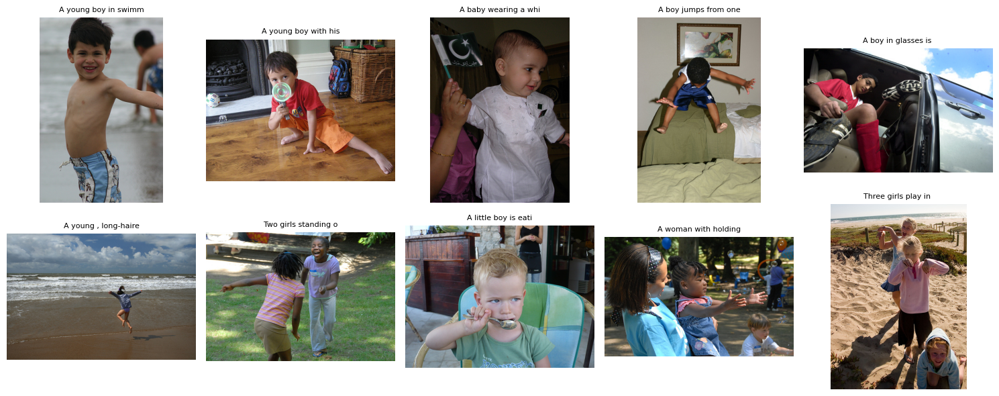

In [100]:
# Посмотрим на отфильтрованные фото

sample_blocked = blocked_images.head(10)

plt.figure(figsize=(15, 6))
for i, (fname, text) in enumerate(zip(sample_blocked["image"], sample_blocked["query_text"])):
    img_path = os.path.join(pth_train_images_folder, fname)
    img = plt.imread(img_path)

    plt.subplot(2, 5, i+1)
    plt.imshow(img)
    plt.title(text[:20], fontsize=8)
    plt.axis("off")

plt.tight_layout()
plt.show()

In [101]:
# Выкинем из train_df все строки по этим изображениям

train_clean = (
    train_df.loc[~train_df["image"].astype(str).isin(blocked_images["image"])]
    .drop(columns=["to_block"])
    .reset_index(drop=True)
)

In [102]:
# Посмотрим что получилось

overview_data(train_clean)

--------------------------------------------------
Инфо
--------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32516 entries, 0 to 32515
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       32516 non-null  object 
 1   query_id    32516 non-null  object 
 2   target      32516 non-null  float64
 3   query_text  32516 non-null  object 
dtypes: float64(1), object(3)
memory usage: 1016.2+ KB


--------------------------------------------------
Статистика
--------------------------------------------------


--------------------------------------------------
Пропуски
--------------------------------------------------
image         0
query_id      0
target        0
query_text    0
dtype: int64


--------------------------------------------------
Дубликаты
--------------------------------------------------
0


--------------------------------------------------
Нулевые зн

## Вывод

- Провели очистку датасета от изображений с детьми
- Визуально оценили отфильтрованные изображения

# Векторизация изображений

Перейдём к векторизации изображений.

Самый примитивный способ — прочесть изображение и превратить полученную матрицу в вектор. Такой способ нам не подходит: длина векторов может быть сильно разной, так как размеры изображений разные. Поэтому стоит обратиться к свёрточным сетям: они позволяют «выделить» главные компоненты изображений. Как это сделать? Нужно выбрать какую-либо архитектуру, например ResNet-18, посмотреть на слои и исключить полносвязные слои, которые отвечают за конечное предсказание. При этом можно загрузить модель данной архитектуры, предварительно натренированную на датасете ImageNet.

## ResNet50

In [103]:
def make_image_iterator(
        df: pd.DataFrame,
        images_dir: Union[str, Path]
) -> KerasSequence:
    """
    Создаёт итератор батчей изображений из датафрейма для подачи в ResNet.

    Параметры
    ----------
    df : pandas.DataFrame
        Таблица с колонкой 'image', содержащей имена файлов изображений.
    images_dir : str или pathlib.Path
        Путь к директории, где лежат файлы изображений.

    Возвращает
    ----------
    tensorflow.keras.preprocessing.image.DataFrameIterator
        Итератор Keras, по очереди выдающий батчи изображений формы
        (batch_size, 224, 224, 3), предобработанных функцией
        ``tensorflow.keras.applications.resnet.preprocess_input``.
    """

    datagen = ImageDataGenerator(preprocessing_function=preprocess_input)

    it = datagen.flow_from_dataframe(
        dataframe=df,
        directory=images_dir,
        x_col="image",
        y_col=None,
        target_size=(224, 224),
        class_mode=None,
        shuffle=False,
        batch_size=64
    )
    return it

In [104]:
def create_feature_extractor() -> tf.keras.Model:
    """
    Создаёт сверточный экстрактор признаков на базе ResNet50 с весами ImageNet.
    Вход: изображения формы (224, 224, 3), предобработанные функцией
    ``tensorflow.keras.applications.resnet.preprocess_input``.
    Выход: признаковый вектор длины 2048 (за счёт ``pooling="avg"``).

    Возвращает
    ----------
    tensorflow.keras.Model
        Модель Keras, которая преобразует батч изображений в тензор
        формы (batch_size, 2048). Все слои заморожены (``model.trainable = False``).

    """
    model = ResNet50(
        include_top=False,
        weights="imagenet",
        input_shape=(224, 224, 3),
        pooling="avg"
    )
    model.trainable = False
    return model

In [105]:
def compute_embeddings_array(
        df: pd.DataFrame,
        images_dir: str
) -> np.ndarray:
    """
    Возвращает массив эмбеддингов изображений.

    Параметры
    ----------
    df : pandas.DataFrame
        Таблица с колонкой 'image', содержащей имена файлов изображений.
    images_dir : str
        Путь к директории, где лежат изображения.

    Возвращает
    ----------
    numpy.ndarray
        Массив уникальных эмбеддингов формы (N, 2048) с типом данных float32.
    """
    df_unique = pd.DataFrame({"image": df["image"].dropna().astype(str).unique()})
    it = make_image_iterator(df_unique, images_dir)
    model = create_feature_extractor()

    embs_unique = model.predict(it, verbose=1).astype("float32")

    print("embs shape:", embs_unique.shape)
    print("dtype:", embs_unique.dtype)
    return embs_unique, df_unique

In [106]:
def exp_embeddings(
        df: pd.DataFrame,
        uniq_df: pd.DataFrame,
        embs_unique: np.ndarray
) -> np.ndarray:
    """
    Расширяет матрицу эмбеддингов уникальных изображений на полный датасет.

    Для каждой строки исходного датафрейма `df` находит позицию её изображения
    в датафрейме уникальных изображений `uniq_df` и выбирает соответствующий
    вектор из массива `embs_unique`. Таким образом восстанавливается матрица
    эмбеддингов в том же порядке, что и строки `df`.

    Параметры
    ----------
    df : pandas.DataFrame
        Основной датафрейм с колонкой 'image'. Размерность N строк (может содержать повторы).
    uniq_df : pandas.DataFrame
        Датафрейм с уникальными именами изображений в колонке 'image'.
        Размерность U строк, порядок строк должен соответствовать порядку
        векторов в `embs_unique`.
    embs_unique : numpy.ndarray
        Массив эмбеддингов уникальных изображений формы (U, D),
        где D — размерность эмбеддинга (например, 2048).

    Возвращает
    ----------
    numpy.ndarray
        Массив эмбеддингов формы (N, D) в порядке строк `df`.
    """

    pos = pd.Series(range(len(uniq_df)), index=uniq_df["image"])
    idx = df["image"].astype(str).map(pos)
    idx = idx.astype(int).to_numpy()
    embs = embs_unique[idx]
    return embs

### Векторизация

In [107]:
# Выведем список физических GPU

print(tf.config.list_physical_devices("GPU"))

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [108]:
%%time
# Посчитаем уникальные эмбединги изображений ResNet50

embs_unique, unique_df = compute_embeddings_array(train_clean, pth_train_images_folder)

Found 712 validated image filenames.


I0000 00:00:1761991714.137824    7005 gpu_device.cc:2020] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 5592 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 3060 Ti, pci bus id: 0000:07:00.0, compute capability: 8.6
2025-11-01 13:08:37.888396: I external/local_xla/xla/service/service.cc:163] XLA service 0x72eec4003cf0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2025-11-01 13:08:37.888425: I external/local_xla/xla/service/service.cc:171]   StreamExecutor device (0): NVIDIA GeForce RTX 3060 Ti, Compute Capability 8.6
2025-11-01 13:08:37.968033: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2025-11-01 13:08:38.418703: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:473] Loaded cuDNN version 91002


 1/12 ━━━━━━━━━━━━━━━━━━━━ 1:07 6s/step

I0000 00:00:1761991722.775815   15274 device_compiler.h:196] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


12/12 ━━━━━━━━━━━━━━━━━━━━ 12s 573ms/step
embs shape: (712, 2048)
dtype: float32
CPU times: user 12.9 s, sys: 2.3 s, total: 15.2 s
Wall time: 15.2 s


In [109]:
# Распространяем на весь датасет

embs = exp_embeddings(train_clean, unique_df, embs_unique)

## Вывод

- Провели векторизацию изображений с помощью предобученной ResNet50 с весами ImageNet

# Векторизация текстов

Следующий этап — векторизация текстов. Вы можете поэкспериментировать с несколькими способами векторизации текстов:

- tf-idf
- word2vec
- \*трансформеры (например Bert)

\* — если вы изучали трансформеры в спринте Машинное обучение для текстов.


## TF-IDF

In [110]:
def build_tfidf(
    train_texts: List[str],
    max_features: int = 50000,
    ngram_range: Tuple[int, int] = (1, 2)
) -> Tuple[TfidfVectorizer, csr_matrix]:
    """
    Обучает TF-IDF векторизатор на тренировочных текстах и возвращает
    разреженную матрицу признаков.

    Параметры
    ----------
    train_texts : list of str
        Список строк (документов), на которых обучается векторизатор.
        Каждый элемент списка — отдельный текст (запрос, предложение и т.п.).

    max_features : int, optional (default=50000)
        Максимальное количество признаков (размер словаря).
        Если слов в корпусе больше, сохраняются только наиболее часто встречающиеся.

    ngram_range : tuple of (int, int), optional (default=(1, 2))
        Диапазон n-грамм, которые будут использоваться.
        Например, (1, 2) — это униграммы и биграммы.

    Возвращает
    -------
    vectorizer : TfidfVectorizer
        Обученный векторизатор. Его можно применять для преобразования тестовых данных
        (через `transform`), чтобы использовать те же признаки.

    X_tfidf : csr_matrix of shape (n_samples, n_features)
        Разреженная матрица TF-IDF, где строки соответствуют документам,
        а столбцы — признакам (ngram’ам).
    """
    if not train_texts or not all(isinstance(t, str) for t in train_texts):
        raise ValueError("train_texts должен быть непустым списком строк")

    vectorizer = TfidfVectorizer(max_features=max_features, ngram_range=ngram_range)
    X_tfidf: csr_matrix = vectorizer.fit_transform(train_texts)
    print(f"TF-IDF обучен: shape={X_tfidf.shape}, dtype={X_tfidf.dtype}")
    return vectorizer, X_tfidf

In [111]:
def transform_tfidf(
    vectorizer: TfidfVectorizer,
    texts: List[str]
) -> csr_matrix:
    """
    Применяет обученный TF-IDF к новым данным.

    Параметры
    ----------
    vectorizer : TfidfVectorizer
        Обученный векторизатор (из build_tfidf).
    texts : list[str]
        Новые тексты.

    Возвращает
    -------
    csr_matrix
        Матрица TF-IDF для новых текстов.
    """
    X_tfidf = vectorizer.transform(texts)
    print(f"TF-IDF трансформация: shape={X_tfidf.shape}, dtype={X_tfidf.dtype}")
    return X_tfidf

## Word2Vec

In [112]:
%%time
# Загрузим предобученную модель Google News

w2v_model = api.load("word2vec-google-news-300")

CPU times: user 27.1 s, sys: 5.68 s, total: 32.8 s
Wall time: 33.3 s


In [113]:
def sent_vector(
        tokens: List[str],
        model: Word2Vec
) -> np.ndarray:
    """
    Преобразует список токенов в усреднённый вектор предложения
    с использованием эмбеддингов Word2Vec.

    Параметры
    ----------
    tokens : list of str
        Список токенов (слов) одного предложения.
    model : Word2Vec
        Обученная модель Word2Vec, содержащая векторы слов.

    Возвращает
    -------
    vec : np.ndarray of shape (vector_size,)
        Усреднённый вектор предложения. Если все слова отсутствуют
        в словаре модели, возвращается вектор из нулей.
    """
    vecs = [model[w] for w in tokens if w in model]
    return np.mean(vecs, axis=0) if vecs else np.zeros(model.vector_size, dtype=np.float32)

In [114]:
def transform_w2v(
    model: Word2Vec,
    texts: List[str]
) -> np.ndarray:
    """
    Применяет обученный Word2Vec к новым данным.

    Параметры
    ----------
    model : Word2Vec
        Обученная модель.
    texts : list[str]
        Новые тексты.

    Возвращает
    -------
    np.ndarray
        Матрица эмбеддингов, shape = (N, vector_size).
    """
    tokenized = [simple_preprocess(t) for t in texts]
    X_w2v = np.vstack([sent_vector(t, model) for t in tokenized])
    print(f"Word2Vec трансформация: shape={X_w2v.shape}, dtype={X_w2v.dtype}")
    return X_w2v

## SBERT

In [115]:
def build_sbert(
    train_texts: List[str],
    model_name: str = "sentence-transformers/paraphrase-multilingual-MiniLM-L12-v2",
    batch_size: int = 64,
    normalize_embeddings: bool = True,
    device: Optional[str] = None,          # 'cpu' | 'cuda' | None (автоопределение)
    convert_dtype=np.float32,
) -> Tuple[SentenceTransformer, np.ndarray]:
    """
    Загружает предобученную модель SBERT и преобразует тексты в эмбеддинги.

    Обучения в этой функции нет: модель берётся готовая.

    Параметры
    ----------
    train_texts : list of str
        Список строк (документов), которые необходимо преобразовать
        в векторные представления.

    model_name : str, optional (default="sentence-transformers/paraphrase-multilingual-MiniLM-L12-v2")
        Название модели из библиотеки `sentence-transformers` или путь к локальной модели.

    batch_size : int, optional (default=64)
        Размер батча. Большие значения ускоряют процесс,
        но требуют больше видеопамяти.

    normalize_embeddings : bool, optional (default=True)
        Если True, то эмбеддинги нормализуются по L2-норме.

    device : {"cpu", "cuda", None}, optional (default=None)
        Устройство для выполнения (CPU, GPU). Если None, выбирается автоматически.

    convert_dtype : np.dtype, optional (default=np.float32)
        Тип данных результирующего массива (например, np.float32 или np.float16).

    Возвращает
    -------
    model : SentenceTransformer
        Загруженная модель, которую можно использовать для преобразования новых данных
        (`model.encode(test_texts, ...)`).

    X_sbert : np.ndarray of shape (n_samples, embedding_dim)
        Плотная матрица эмбеддингов. Каждая строка соответствует одному тексту,
        столбцы — координаты векторного пространства модели.
    """

    model = SentenceTransformer(model_name, device=device)
    X_sbert = model.encode(
        train_texts,
        batch_size=batch_size,
        show_progress_bar=True,
        convert_to_numpy=True,
        normalize_embeddings=normalize_embeddings,
    ).astype(convert_dtype, copy=False)

    print(f"SBERT P{model} обучен: shape={X_sbert.shape}, dtype={X_sbert.dtype}")
    return model, X_sbert

In [116]:
def transform_sbert(
    model: SentenceTransformer,
    texts: List[str],
    batch_size: int = 64,
    normalize_embeddings: bool = True,
    convert_dtype=np.float32,
) -> np.ndarray:
    """
    Применяет загруженную/созданную SBERT модель к новым данным
    и возвращает матрицу эмбеддингов.

    Параметры
    ----------
    model : SentenceTransformer
        Предобученная модель SBERT, например полученная через `build_sbert`.

    texts : list of str
        Список строк (документов), которые необходимо преобразовать
        в эмбеддинги.

    batch_size : int, optional (default=64)
        Размер батча. Большие значения ускоряют процесс,
        но требуют больше видеопамяти.

    normalize_embeddings : bool, optional (default=True)
        Если True, то эмбеддинги нормализуются по L2-норме.

    convert_dtype : np.dtype, optional (default=np.float32)
        Тип данных результирующего массива (например, np.float32 или np.float16).

    Возвращает
    -------
    X_sbert : np.ndarray of shape (n_samples, embedding_dim)
        Плотная матрица эмбеддингов. Каждая строка соответствует одному тексту,
        столбцы — координаты векторного пространства модели.

    """
    X_sbert = model.encode(
        texts,
        batch_size=batch_size,
        show_progress_bar=True,
        convert_to_numpy=True,
        normalize_embeddings=normalize_embeddings,
    ).astype(convert_dtype, copy=False)

    print(f"SBERT {model} трансформация: shape={X_sbert.shape}, dtype={X_sbert.dtype}")
    return X_sbert

## Векторизация

In [117]:
%%time
# Подготовим данные и обучим TF-IDF

train_texts = train_clean["query_text"].astype(str).tolist()
tfidf_vectorizer, X_tfidf_train = build_tfidf(train_texts)

TF-IDF обучен: shape=(32516, 6279), dtype=float64
CPU times: user 287 ms, sys: 0 ns, total: 287 ms
Wall time: 287 ms


In [118]:
%%time
# Подготовим данные и обучим Word2Vec

X_w2v_train = transform_w2v(w2v_model, train_texts)

Word2Vec трансформация: shape=(32516, 300), dtype=float32
CPU times: user 856 ms, sys: 53.5 ms, total: 910 ms
Wall time: 909 ms


In [119]:
%%time
# Подготовим данные и обучим SBERT

sbert_model, X_sbert_train = build_sbert(train_texts)

Batches:   0%|          | 0/509 [00:00<?, ?it/s]

SBERT PSentenceTransformer(
  (0): Transformer({'max_seq_length': 128, 'do_lower_case': False, 'architecture': 'BertModel'})
  (1): Pooling({'word_embedding_dimension': 384, 'pooling_mode_cls_token': False, 'pooling_mode_mean_tokens': True, 'pooling_mode_max_tokens': False, 'pooling_mode_mean_sqrt_len_tokens': False, 'pooling_mode_weightedmean_tokens': False, 'pooling_mode_lasttoken': False, 'include_prompt': True})
) обучен: shape=(32516, 384), dtype=float32
CPU times: user 18.9 s, sys: 5.83 s, total: 24.7 s
Wall time: 21.5 s


## Вывод

- Провели векторизацию текстовых запросов с помощью TF-IDF, Word2Vec, SBERT

# Объединение векторов

Подготовьте данные для обучения: объедините векторы изображений и векторы текстов с целевой переменной.

In [120]:
# Сделаем нормализацию по каждому блоку

norm = Normalizer(norm="l2")

X_img_norm = norm.fit_transform(embs)
X_tfidf_norm = norm.fit_transform(X_tfidf_train)
X_w2v_norm = norm.fit_transform(X_w2v_train)
X_sbert_norm = norm.fit_transform(X_sbert_train)

In [121]:
%%time
# Объединим векторы изображений и векторы текстов

X_tfidf_train = hstack([csr_matrix(X_img_norm), X_tfidf_norm])
X_w2v_train = hstack([csr_matrix(X_img_norm), X_w2v_norm])
X_sbert_train = hstack([csr_matrix(X_img_norm), X_sbert_norm])

print(f"TFIDF+IMG shape={X_tfidf_train.shape}")
print(f"W2V+IMG shape={X_w2v_train.shape}")
print(f"SBERT+IMG shape={X_sbert_train.shape}")

TFIDF+IMG shape=(32516, 8327)
W2V+IMG shape=(32516, 2348)
SBERT+IMG shape=(32516, 2432)
CPU times: user 3.89 s, sys: 1.93 s, total: 5.81 s
Wall time: 5.81 s


In [122]:
# Приведем таргет значениям вида 0 или 1

train_clean["target_bin"] = (train_clean["target"] >= 0.5).astype(int)
y = train_clean["target_bin"]

## Вывод

- Объединили векторы изображений и векторы запросов
- Привели таргет к бинарному виду

# Обучение модели предсказания соответствия

Для обучения разделим датасет на тренировочную и тестовую выборки. Простое случайное разбиение не подходит: нужно исключить попадание изображения и в обучающую, и в тестовую выборки.

Выбираем метрику ROC-AUC, а также precision для класса 1, так как для нас важно правильно определять изображения, соответствующие запросу.

In [123]:
ArrayLike = Union[np.ndarray, csr_matrix]

def group_train_test_split(
    X: ArrayLike,
    y: Union[np.ndarray, "pd.Series", list],
    groups: Union[np.ndarray, "pd.Series", list],
    train_size: float = 0.7,
    random_state: int = RANDOM_STATE,
) -> Tuple[ArrayLike, ArrayLike, np.ndarray, np.ndarray, np.ndarray, np.ndarray]:
    """
    Делит выборку на train/test с учётом группировок (GroupShuffleSplit).

    Параметры
    ----------
    X : array-like or csr_matrix of shape (n_samples, n_features)
        Матрица признаков. Может быть плотной (NumPy) или разреженной (SciPy).
    y : array-like of shape (n_samples,)
        Вектор целевой переменной.
    groups : array-like of shape (n_samples,)
        Метки групп (например, `query_id`). Обеспечивает, что объекты из
        одной группы попадают только в одну часть (train или test).
    train_size : float, optional (default=0.7)
        Доля обучающей выборки (от 0 до 1).
    random_state : int, optional (default=RANDOM_STATE)
        Начальное значение генератора случайных чисел для воспроизводимости.

    Возвращает
    -------
    X_train : array-like or csr_matrix of shape (n_train, n_features)
        Признаки обучающей выборки.
    X_test : array-like or csr_matrix of shape (n_test, n_features)
        Признаки тестовой выборки.
    y_train : np.ndarray of shape (n_train,)
        Целевая переменная для обучающей выборки.
    y_test : np.ndarray of shape (n_test,)
        Целевая переменная для тестовой выборки.
    train_idx : np.ndarray of shape (n_train,)
        Индексы обучающей выборки.
    test_idx : np.ndarray of shape (n_test,)
        Индексы тестовой выборки.
    """

    y_arr = y.to_numpy() if hasattr(y, "to_numpy") else np.asarray(y)
    groups_arr = groups.to_numpy() if hasattr(groups, "to_numpy") else np.asarray(groups)

    gss = GroupShuffleSplit(n_splits=1, train_size=train_size, random_state=random_state)
    tr_idx, te_idx = next(gss.split(np.zeros(len(y_arr)), y_arr, groups_arr))

    if issparse(X):
        X = X.tocsr()

    return (X[tr_idx], X[te_idx],
            y_arr[tr_idx], y_arr[te_idx],
            tr_idx, te_idx)

In [124]:
# Разделим выборки для 3х наборов данных

groups = train_clean["image"].astype(str).fillna("__na__")

# TF-IDF
X_tfidf_tr, X_tfidf_te, y_tr, y_te, tr_idx, te_idx = group_train_test_split(
    X_tfidf_train, y, groups, train_size=0.7
)

# W2V
X_w2v_tr, X_w2v_te, _, _, _, _ = group_train_test_split(
    X_w2v_train, y, groups, train_size=0.7
)

# SBERT
X_sbert_tr, X_sbert_te, _, _, _, _ = group_train_test_split(
    X_sbert_train, y, groups, train_size=0.7
)

print(f"TFIDF+IMG train_shape={X_tfidf_tr.shape}, test_shape={X_tfidf_te.shape}")
print(f"W2V+IMG train_shape={X_w2v_tr.shape}, test_shape={X_w2v_te.shape}")
print(f"SBERT+IMG train_shape={X_sbert_tr.shape}, test_shape={X_sbert_te.shape}")
print(f"y train_shape={y_tr.shape}, test_shape={y_te.shape}")

TFIDF+IMG train_shape=(22940, 8327), test_shape=(9576, 8327)
W2V+IMG train_shape=(22940, 2348), test_shape=(9576, 2348)
SBERT+IMG train_shape=(22940, 2432), test_shape=(9576, 2432)
y train_shape=(22940,), test_shape=(9576,)


In [125]:
# Создадим список из трёх кортежей с признаками для каждого набора данных

feature_sets = [
    ("TFIDF+IMG", X_tfidf_tr, X_tfidf_te),
    ("W2V+IMG",   X_w2v_tr,   X_w2v_te),
    ("SBERT+IMG", X_sbert_tr, X_sbert_te),
]

In [126]:
def predict_proba01(
    model: BaseEstimator,
    X: Union[np.ndarray, "csr_matrix"]
) -> np.ndarray:
    """
    Унифицирует получение вероятностей класса 1 (положительного класса)
    для разных типов моделей.

    Параметры
    ----------
    model : sklearn.base.BaseEstimator
        Обученная модель из scikit-learn или совместимого интерфейса.

    X : array-like or csr_matrix of shape (n_samples, n_features)
        Матрица признаков (плотная или разреженная).

    Возвращает
    -------
    proba : np.ndarray of shape (n_samples,)
        Вектор вероятностей принадлежности к положительному классу (класс 1).
    """
    if hasattr(model, "predict_proba"):
        return model.predict_proba(X)[:, 1]
    if hasattr(model, "decision_function"):
        return sigmoid(model.decision_function(X))
    return model.predict(X).astype(float)

In [127]:
def eval_on_sets(
    model_proto: BaseEstimator,
    model_name: str
) -> List[Dict[str, Any]]:
    """
    Обучает модель на каждом наборе признаков (feature_sets)
    и считает метрики качества.

    Метрики:
    - ROC-AUC (по вероятностным предсказаниям)
    - Precision и Recall для положительного класса (1)
    - Precision и Recall для отрицательного класса (0)

    Порог для бинаризации вероятностей фиксирован на 0.5.

    Параметры
    ----------
    model_proto : sklearn.base.BaseEstimator
        Прототип модели (например, LogisticRegression()).
        Для каждого фичсета создаётся клон через `sklearn.base.clone`.
    model_name : str
        Название модели (используется в выводе и в результатах).

    Возвращает
    -------
    results : list of dict
        Список словарей с результатами по каждому набору признаков.
        В каждом словаре содержатся ключи:
        - "features" : str, имя набора признаков
        - "model" : str, имя модели
        - "ROC-AUC" : float
        - "Precision_1" : float
        - "Recall_1" : float
        - "Precision_0" : float
        - "Recall_0" : float
    """
    results: List[Dict[str, Any]] = []

    for feat_name, Xtr, Xte in feature_sets:
        if issparse(Xtr):
            Xtr = Xtr.tocsr()
        if issparse(Xte):
            Xte = Xte.tocsr()

        model = clone(model_proto)

        model.fit(Xtr, y_tr)
        y_score: np.ndarray = predict_proba01(model, Xte)
        y_pred: np.ndarray = (y_score >= 0.5).astype(int)

        res: Dict[str, Any] = {
            "features": feat_name,
            "model": model_name,
            "ROC-AUC": roc_auc_score(y_te, y_score),
            "Precision_1": precision_score(y_te, y_pred, pos_label=1, zero_division=0),
            "Recall_1":    recall_score(y_te, y_pred, pos_label=1, zero_division=0),
            "Precision_0": precision_score(y_te, y_pred, pos_label=0, zero_division=0),
            "Recall_0":    recall_score(y_te, y_pred, pos_label=0, zero_division=0),
        }
        results.append(res)

        print(f"{feat_name:10s} | {model_name:10s} -> "
              f"ROC-AUC={res['ROC-AUC']:.3f} | "
              f"P1={res['Precision_1']:.3f} R1={res['Recall_1']:.3f} | "
              f"P0={res['Precision_0']:.3f} R0={res['Recall_0']:.3f}")
    return results

In [128]:
def create_keras_mlp(
        input_dim: int
) -> tf.keras.Model:
    """
    Создаёт простую многослойную полносвязную нейросеть (MLP) для бинарной классификации.

    Архитектура:
    - Входной слой размерности `input_dim`
    - Полносвязный слой: 512 нейронов, ReLU
    - Полносвязный слой: 128 нейронов, ReLU
    - Выходной слой: 1 нейрон, Sigmoid (даёт вероятность класса 1)

    Компиляция:
    - Оптимизатор: Adam (lr=1e-3)
    - Функция потерь: binary_crossentropy
    - Метрики: ROC-AUC (tf.keras.metrics.AUC)

    Параметры
    ----------
    input_dim : int
        Размерность входного вектора признаков.

    Возвращает
    ----------
    model : tf.keras.Model
        Скомпилированная Keras-модель для обучения и предсказаний.
    """
    model = Sequential([
        Input(shape=(input_dim,), dtype="float32", name="input_layer"),
        Dense(512, activation="relu", name="dense_512"),
        Dense(128, activation="relu", name="dense_128"),
        Dense(1, activation="sigmoid", name="output"),
    ])
    model.compile(
        optimizer=Adam(learning_rate=1e-3),
        loss="binary_crossentropy",
        metrics=[tf.keras.metrics.AUC(name="roc_auc")]
    )
    return model

In [129]:
def eval_on_sets_keras(
    epochs: int = 10,
    batch_size: int = 512,
    model_name: str = "KerasMLP",
    return_models: bool = False
) -> Union[List[Dict[str, float]], Tuple[List[Dict[str, float]], Dict[str, tf.keras.Model]]]:
    """
    Обучает простую Keras-MLP модель на каждом наборе признаков (feature_sets)
    и вычисляет метрики качества.

    Метрики:
    - ROC-AUC (по вероятностным предсказаниям)
    - Precision и Recall для классов 1 и 0
    Порог бинаризации фиксирован: 0.5

    Баланс классов учитывается через class_weight (веса "balanced").

    Параметры
    ----------
    epochs : int, optional (default=10)
        Количество эпох обучения модели.
    batch_size : int, optional (default=512)
        Размер батча при обучении.
    model_name : str, optional (default="KerasMLP")
        Имя модели (для логов и вывода).
    return_models : bool, optional (default=False)
        Если True, дополнительно возвращает словарь обученных моделей.

    Возвращает
    ----------
    results : list of dict
        Список словарей с результатами по каждому фичсету.
        Каждый словарь содержит:
        - "features": str, имя набора признаков
        - "model": str, имя модели
        - "ROC-AUC": float
        - "Precision_1": float
        - "Recall_1": float
        - "Precision_0": float
        - "Recall_0": float

    models : dict[str, tf.keras.Model], optional
        Если `return_models=True`, возвращается также словарь:
        {имя_фичсета: обученная Keras-модель}.
    """
    results: List[Dict[str, float]] = []
    models: Dict[str, tf.keras.Model] = {}

    p, n = (y_tr == 1).sum(), (y_tr == 0).sum()
    class_weight = {0: 1.0, 1: n / max(p, 1)}

    for feat_name, Xtr, Xte in feature_sets:
        Xtr_d: np.ndarray = Xtr.toarray() if issparse(Xtr) else np.asarray(Xtr, dtype=np.float32)
        Xte_d: np.ndarray = Xte.toarray() if issparse(Xte) else np.asarray(Xte, dtype=np.float32)

        model: tf.keras.Model = create_keras_mlp(Xtr_d.shape[1])
        model.fit(
            Xtr_d, y_tr,
            epochs=epochs,
            batch_size=batch_size,
            verbose=0,
            class_weight=class_weight
        )

        y_score: np.ndarray = model.predict(Xte_d, batch_size=1024, verbose=0).ravel()
        y_pred: np.ndarray = (y_score >= 0.5).astype(int)

        res: Dict[str, float] = {
            "features": feat_name,
            "model": model_name,
            "ROC-AUC": roc_auc_score(y_te, y_score),
            "Precision_1": precision_score(y_te, y_pred, pos_label=1, zero_division=0),
            "Recall_1":    recall_score(y_te, y_pred, pos_label=1, zero_division=0),
            "Precision_0": precision_score(y_te, y_pred, pos_label=0, zero_division=0),
            "Recall_0":    recall_score(y_te, y_pred, pos_label=0, zero_division=0),
        }

        print(f"{feat_name:10s} | {model_name:9s} -> "
              f"ROC-AUC={res['ROC-AUC']:.3f} | "
              f"P1={res['Precision_1']:.3f} R1={res['Recall_1']:.3f} | "
              f"P0={res['Precision_0']:.3f} R0={res['Recall_0']:.3f}")

        results.append(res)
        if return_models:
            models[feat_name] = model

    return (results, models) if return_models else results

In [130]:
%%time
# Обучим LogisticRegression

log_reg = LogisticRegression(
    max_iter=2000,
    class_weight="balanced",
    random_state=RANDOM_STATE
)

results_lr = eval_on_sets(log_reg, "LogReg")

TFIDF+IMG  | LogReg     -> ROC-AUC=0.675 | P1=0.106 R1=0.556 | P0=0.962 R0=0.708
W2V+IMG    | LogReg     -> ROC-AUC=0.672 | P1=0.097 R1=0.554 | P0=0.960 R0=0.676
SBERT+IMG  | LogReg     -> ROC-AUC=0.688 | P1=0.106 R1=0.584 | P0=0.964 R0=0.691
CPU times: user 11.2 s, sys: 513 ms, total: 11.7 s
Wall time: 11.7 s


In [131]:
%%time
# Обучим LGBMClassifier
light_gbm = LGBMClassifier(
    random_state=RANDOM_STATE,
    n_jobs=-1,
    class_weight="balanced",
    verbose=-1
)

results_lgbm = eval_on_sets(light_gbm, "LightGBM")

TFIDF+IMG  | LightGBM   -> ROC-AUC=0.684 | P1=0.152 R1=0.331 | P0=0.955 R0=0.884
W2V+IMG    | LightGBM   -> ROC-AUC=0.710 | P1=0.218 R1=0.257 | P0=0.953 R0=0.942
SBERT+IMG  | LightGBM   -> ROC-AUC=0.722 | P1=0.217 R1=0.250 | P0=0.953 R0=0.944
CPU times: user 10min 17s, sys: 3.49 s, total: 10min 20s
Wall time: 44.8 s


In [132]:
%%time
# Обучим CatBoostClassifier

cat_boost = CatBoostClassifier(
    verbose=False,
    random_state=RANDOM_STATE,
    auto_class_weights="Balanced"
)

results_cat = eval_on_sets(cat_boost, "CatBoost")

TFIDF+IMG  | CatBoost   -> ROC-AUC=0.714 | P1=0.262 R1=0.219 | P0=0.952 R0=0.961
W2V+IMG    | CatBoost   -> ROC-AUC=0.731 | P1=0.423 R1=0.126 | P0=0.947 R0=0.989
SBERT+IMG  | CatBoost   -> ROC-AUC=0.748 | P1=0.402 R1=0.124 | P0=0.947 R0=0.988
CPU times: user 1h 16min 40s, sys: 9min 16s, total: 1h 25min 57s
Wall time: 5min 44s


In [133]:
%%time
### Обучим MLP

results_keras, mlp = eval_on_sets_keras(epochs=20, return_models=True)

2025-11-01 13:16:39.086693: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_68', 320 bytes spill stores, 316 bytes spill loads

2025-11-01 13:16:41.519354: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_68', 416 bytes spill stores, 356 bytes spill loads

2025-11-01 13:16:51.127531: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_14', 16 bytes spill stores, 16 bytes spill loads

2025-11-01 13:16:51.322764: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_14', 760 bytes spill stores, 756 bytes spill loads

2025-11-01 13:16:51.903028: I external/loc

TFIDF+IMG  | KerasMLP  -> ROC-AUC=0.709 | P1=0.409 R1=0.188 | P0=0.951 R0=0.983


2025-11-01 13:16:54.968330: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_378', 4 bytes spill stores, 4 bytes spill loads

2025-11-01 13:16:55.130362: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_68', 220 bytes spill stores, 220 bytes spill loads

2025-11-01 13:16:55.197648: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_68', 120 bytes spill stores, 120 bytes spill loads

2025-11-01 13:16:57.347799: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_68', 224 bytes spill stores, 224 bytes spill loads

2025-11-01 13:16:57.433610: I external/loca

W2V+IMG    | KerasMLP  -> ROC-AUC=0.751 | P1=0.246 R1=0.340 | P0=0.958 R0=0.935


2025-11-01 13:17:07.260613: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_68', 4 bytes spill stores, 4 bytes spill loads

2025-11-01 13:17:09.363332: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_68', 32 bytes spill stores, 32 bytes spill loads

2025-11-01 13:17:14.909490: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_14', 540 bytes spill stores, 540 bytes spill loads

2025-11-01 13:17:15.998627: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_14', 696 bytes spill stores, 548 bytes spill loads

2025-11-01 13:17:16.188840: I external/local_x

SBERT+IMG  | KerasMLP  -> ROC-AUC=0.778 | P1=0.346 R1=0.317 | P0=0.957 R0=0.962
CPU times: user 1min 7s, sys: 24.4 s, total: 1min 32s
Wall time: 43.4 s


In [134]:
# Берем из словаря моделей mlp модель, обученную на признаках SBERT+IMG.

mlp = mlp["SBERT+IMG"]

## Вывод

- Выбрали метрику ROC-AUC, а также precision для класса 1, так как для нас важно правильно определять изображения, соответствующие запросу.
- Обучили 3 модели (LogisticRegression, LGBMClassifier, CatBoostClassifier) на 3х наборах данных (TFIDF+IMG, W2V+IMG, SBERT+IMG)
- Выбрали лучшую модель - SBERT+IMG  | CatBoost   -> ROC-AUC=0.751 | P1=0.453 R1=0.187 | P0=0.935 R0=0.981
- Обучили лучшую модель на всем наборе данных

# Тестирование модели

Настало время протестировать модель. Для этого получите эмбеддинги для всех тестовых изображений из папки `test_images`, выберите случайные 10 запросов из файла `test_queries.csv` и для каждого запроса выведите наиболее релевантное изображение. Сравните визуально качество поиска.

In [135]:
# Берем тестовые картинки

pool = test_images[['image']].reset_index(drop=True)

In [136]:
# Считаем эмбеддинги и распаковываем кортеж

embs_test, _ = compute_embeddings_array(pool, pth_test_images_folder)

Found 100 validated image filenames.
2/2 ━━━━━━━━━━━━━━━━━━━━ 8s 5s/step
embs shape: (100, 2048)
dtype: float32


In [137]:
# Нормализуем изображения, как при обучении, и переводим в csr

X_img_pool = csr_matrix(norm.fit_transform(embs_test.astype(np.float32)))

In [138]:
# Определяем порядок имен файлов

img_names_pool = pool['image'].tolist()

In [139]:
def search_best_image(
    query_text: str,
    model: tf.keras.Model,
    sbert_model,
    top_k: int = 5
) -> List[Tuple[str, float]]:
    """
    Выполняет поиск наиболее релевантных изображений для текстового запроса.

    Алгоритм:
    1. Проверяет запрос на недопустимый контент (дети, подростки и пр.).
       Если найдено — возвращает пустой список и печатает дисклеймер.
    2. Преобразует запрос в вектор при помощи SBERT и нормализует его (L2).
    3. Повторяет вектор текста для каждого изображения в пуле.
    4. Конкатенирует вектор изображения и запроса так же, как было при обучении.
    5. Получает предсказания модели (вероятности класса 1).
    6. Возвращает топ-k изображений с наибольшими вероятностями.

    Параметры
    ----------
    query_text : str
        Текстовый запрос пользователя.
    model : tf.keras.Model
        Обученная модель (Keras-MLP или другая бинарная классификация),
        обученная на конкатенации [IMG | TEXT].
    sbert_model : SentenceTransformer
        Модель SBERT для векторизации текста.
    top_k : int, optional (default=5)
        Количество изображений, возвращаемых в качестве топа.

    Возвращает
    ----------
    topk : list of (str, float)
        Список кортежей (имя_файла_изображения, вероятность),
        отсортированный по убыванию вероятности.
        Если запрос заблокирован, возвращается сам запрос.
    """
    tmp = pd.DataFrame({"query_text": [query_text]})
    if mark_and_drop_children(tmp, text_col="query_text")["to_block"].iloc[0] == 1:
        print("This image is unavailable in your country in compliance with local laws")
        return []

    x_txt: np.ndarray = transform_sbert(sbert_model, [query_text])
    x_txt = Normalizer(norm="l2").fit_transform(x_txt.astype(np.float32))
    x_txt = csr_matrix(x_txt)

    X_txt_repeat = vstack([x_txt] * X_img_pool.shape[0], format="csr")

    X_cand = hstack([X_img_pool, X_txt_repeat], format="csr")

    scores: np.ndarray = model.predict(X_cand.toarray(), batch_size=1024, verbose=0).ravel()

    order = scores.argsort()[::-1]
    topk: List[Tuple[str, float]] = [(img_names_pool[i], float(scores[i])) for i in order[:top_k]]
    return topk

In [140]:
def show_random_result(
    model: tf.keras.Model,
    sbert_model,
    top_k: int = 5
) -> Optional[None]:
    """
    Выбирает случайный текстовый запрос из test_queries,
    выполняет поиск наиболее релевантных изображений
    и отображает результаты.

    Алгоритм:
    1. Случайным образом выбирает один запрос из test_queries.
    2. Проверяет его через search_best_image (есть ли запретный контент).
    3. Если запрос валиден:
       - Печатает сам запрос.
       - Печатает top-k изображений с их вероятностями.
       - Визуализирует top-k изображений с вероятностями в заголовках.

    Параметры
    ----------
    model : tf.keras.Model
        Обученная Keras-модель (например, MLP),
        принимающая конкатенацию [IMG | TEXT].
    sbert_model : SentenceTransformer
        Модель SBERT для векторизации текстов.
    top_k : int, optional (default=5)
        Количество изображений, отображаемых для запроса.

    Возвращает
    ----------
    None
        Функция выводит результаты и графики, ничего не возвращает.
    """
    query: str = test_queries["query_text"].sample(1).iloc[0]


    topk = search_best_image(query, model, sbert_model, top_k)
    if not topk:
        return query

    print("Query:", query)
    for i, (fname, score) in enumerate(topk, 1):
        print(f"{i}. {fname} — {score:.3f}")

    plt.figure(figsize=(15, 6))
    for i, (fname, score) in enumerate(topk, 1):
        img = plt.imread(os.path.join(pth_test_images_folder, fname))
        ax = plt.subplot(1, top_k, i)
        ax.imshow(img)
        ax.set_title(f"{score:.2f}", fontsize=8)
        ax.axis("off")
    plt.tight_layout()
    plt.show()

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

SBERT SentenceTransformer(
  (0): Transformer({'max_seq_length': 128, 'do_lower_case': False, 'architecture': 'BertModel'})
  (1): Pooling({'word_embedding_dimension': 384, 'pooling_mode_cls_token': False, 'pooling_mode_mean_tokens': True, 'pooling_mode_max_tokens': False, 'pooling_mode_mean_sqrt_len_tokens': False, 'pooling_mode_weightedmean_tokens': False, 'pooling_mode_lasttoken': False, 'include_prompt': True})
) трансформация: shape=(1, 384), dtype=float32


2025-11-01 13:17:26.804233: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_14', 696 bytes spill stores, 548 bytes spill loads



Query: A snowboarder in a red jacket slides down a snowy mountain .
1. 3386953179_84c2d7922f.jpg — 0.996
2. 2141713971_e25eb12712.jpg — 0.982
3. 3163198309_bbfe504f0a.jpg — 0.973
4. 2552438538_285a05b86c.jpg — 0.247
5. 2431120202_b24fe2333a.jpg — 0.175


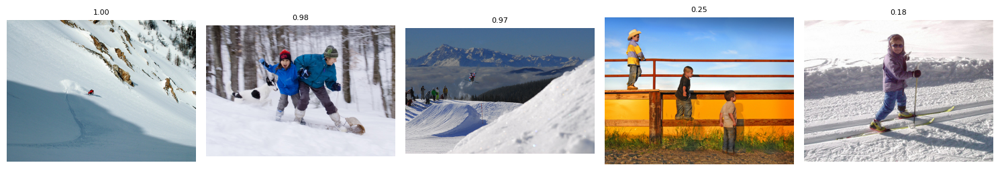

In [141]:
show_random_result(mlp, sbert_model, top_k=5)

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

SBERT SentenceTransformer(
  (0): Transformer({'max_seq_length': 128, 'do_lower_case': False, 'architecture': 'BertModel'})
  (1): Pooling({'word_embedding_dimension': 384, 'pooling_mode_cls_token': False, 'pooling_mode_mean_tokens': True, 'pooling_mode_max_tokens': False, 'pooling_mode_mean_sqrt_len_tokens': False, 'pooling_mode_weightedmean_tokens': False, 'pooling_mode_lasttoken': False, 'include_prompt': True})
) трансформация: shape=(1, 384), dtype=float32
Query: A dog fetching a stick .
1. 3262849619_0bc4f88ef9.jpg — 0.091
2. 1745110280_0cbff5e273.jpg — 0.044
3. 2986716822_e220754d32.jpg — 0.043
4. 1319634306_816f21677f.jpg — 0.026
5. 957682378_46c3b07bcd.jpg — 0.018


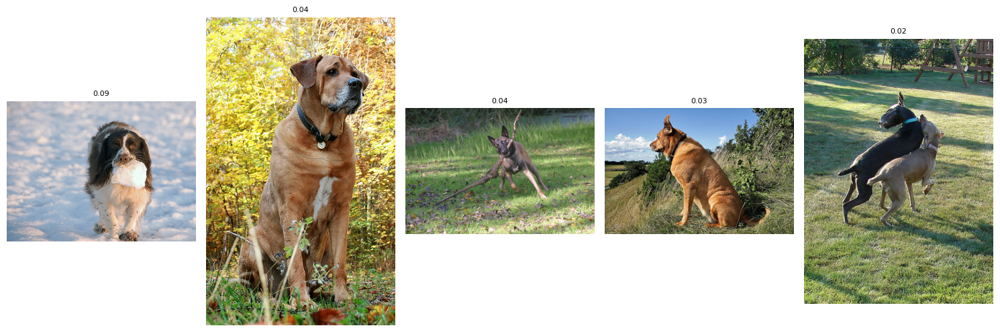

In [142]:
show_random_result(mlp, sbert_model, top_k=5)

In [143]:
show_random_result(mlp, sbert_model, top_k=5)

This image is unavailable in your country in compliance with local laws


'A girl in a black cape with a group of other children'

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

SBERT SentenceTransformer(
  (0): Transformer({'max_seq_length': 128, 'do_lower_case': False, 'architecture': 'BertModel'})
  (1): Pooling({'word_embedding_dimension': 384, 'pooling_mode_cls_token': False, 'pooling_mode_mean_tokens': True, 'pooling_mode_max_tokens': False, 'pooling_mode_mean_sqrt_len_tokens': False, 'pooling_mode_weightedmean_tokens': False, 'pooling_mode_lasttoken': False, 'include_prompt': True})
) трансформация: shape=(1, 384), dtype=float32
Query: A group of people walk through a shopping mall .
1. 3455405300_aa3069ecaa.jpg — 0.196
2. 191003283_992257f835.jpg — 0.153
3. 2552438538_285a05b86c.jpg — 0.089
4. 3170110692_d1e0e66cee.jpg — 0.051
5. 2461990494_c5ece064cc.jpg — 0.031


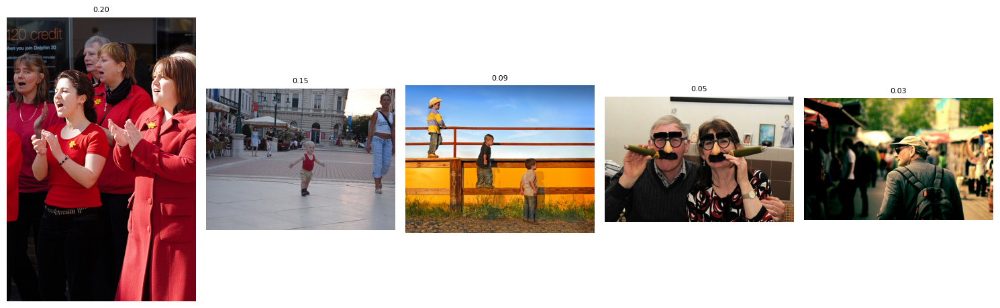

In [144]:
show_random_result(mlp, sbert_model, top_k=5)

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

SBERT SentenceTransformer(
  (0): Transformer({'max_seq_length': 128, 'do_lower_case': False, 'architecture': 'BertModel'})
  (1): Pooling({'word_embedding_dimension': 384, 'pooling_mode_cls_token': False, 'pooling_mode_mean_tokens': True, 'pooling_mode_max_tokens': False, 'pooling_mode_mean_sqrt_len_tokens': False, 'pooling_mode_weightedmean_tokens': False, 'pooling_mode_lasttoken': False, 'include_prompt': True})
) трансформация: shape=(1, 384), dtype=float32
Query: People are watching a race car speed thorugh the dirt .
1. 2552438538_285a05b86c.jpg — 0.089
2. 3089107423_81a24eaf18.jpg — 0.054
3. 3438981089_2ef1a6353c.jpg — 0.053
4. 2977379863_2e8d7a104e.jpg — 0.031
5. 2121140070_a09644550b.jpg — 0.031


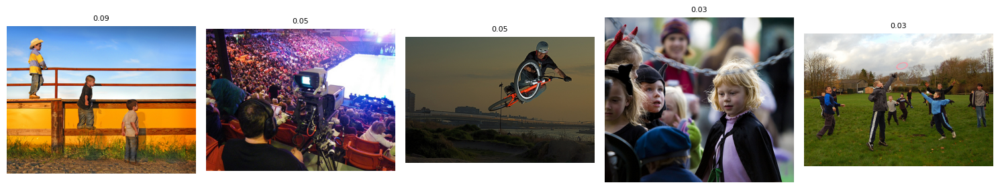

In [145]:
show_random_result(mlp, sbert_model, top_k=5)

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

SBERT SentenceTransformer(
  (0): Transformer({'max_seq_length': 128, 'do_lower_case': False, 'architecture': 'BertModel'})
  (1): Pooling({'word_embedding_dimension': 384, 'pooling_mode_cls_token': False, 'pooling_mode_mean_tokens': True, 'pooling_mode_max_tokens': False, 'pooling_mode_mean_sqrt_len_tokens': False, 'pooling_mode_weightedmean_tokens': False, 'pooling_mode_lasttoken': False, 'include_prompt': True})
) трансформация: shape=(1, 384), dtype=float32
Query: The tennis player in the blue shirt is holding his racquet up in the air .
1. 2552438538_285a05b86c.jpg — 0.984
2. 2399219552_bbba0a9a59.jpg — 0.953
3. 3421547427_53411b6278.jpg — 0.878
4. 2308256827_3c0a7d514d.jpg — 0.460
5. 2687672606_275169c35d.jpg — 0.449


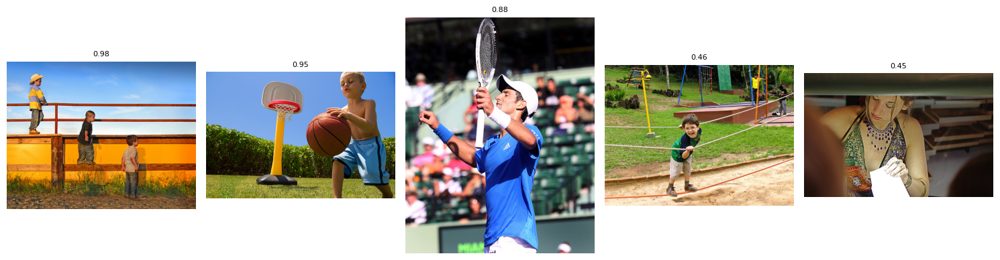

In [146]:
show_random_result(mlp, sbert_model, top_k=5)

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

SBERT SentenceTransformer(
  (0): Transformer({'max_seq_length': 128, 'do_lower_case': False, 'architecture': 'BertModel'})
  (1): Pooling({'word_embedding_dimension': 384, 'pooling_mode_cls_token': False, 'pooling_mode_mean_tokens': True, 'pooling_mode_max_tokens': False, 'pooling_mode_mean_sqrt_len_tokens': False, 'pooling_mode_weightedmean_tokens': False, 'pooling_mode_lasttoken': False, 'include_prompt': True})
) трансформация: shape=(1, 384), dtype=float32
Query: A black and white dog biting onto a chunk of ice .
1. 3262849619_0bc4f88ef9.jpg — 0.418
2. 3247693965_845b3b4349.jpg — 0.011
3. 1319634306_816f21677f.jpg — 0.009
4. 3154152744_4e93ec8a62.jpg — 0.007
5. 3553476195_fb3747d7c1.jpg — 0.003


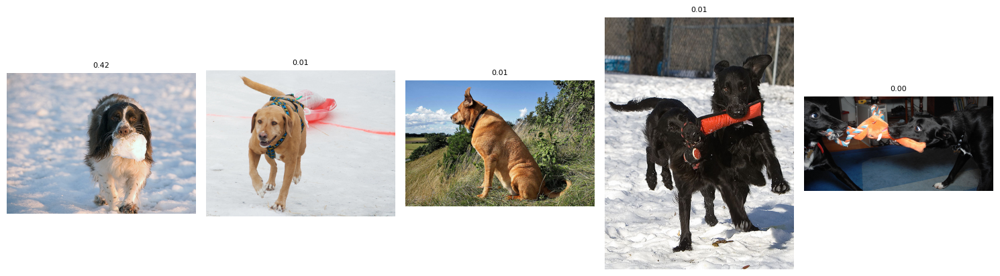

In [147]:
show_random_result(mlp, sbert_model, top_k=5)

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

SBERT SentenceTransformer(
  (0): Transformer({'max_seq_length': 128, 'do_lower_case': False, 'architecture': 'BertModel'})
  (1): Pooling({'word_embedding_dimension': 384, 'pooling_mode_cls_token': False, 'pooling_mode_mean_tokens': True, 'pooling_mode_max_tokens': False, 'pooling_mode_mean_sqrt_len_tokens': False, 'pooling_mode_weightedmean_tokens': False, 'pooling_mode_lasttoken': False, 'include_prompt': True})
) трансформация: shape=(1, 384), dtype=float32
Query: Two black dogs are playing tug-of-war with an orange toy .
1. 957682378_46c3b07bcd.jpg — 0.444
2. 2709359730_13bca100af.jpg — 0.440
3. 3488087117_2719647989.jpg — 0.413
4. 2986716822_e220754d32.jpg — 0.331
5. 1429546659_44cb09cbe2.jpg — 0.317


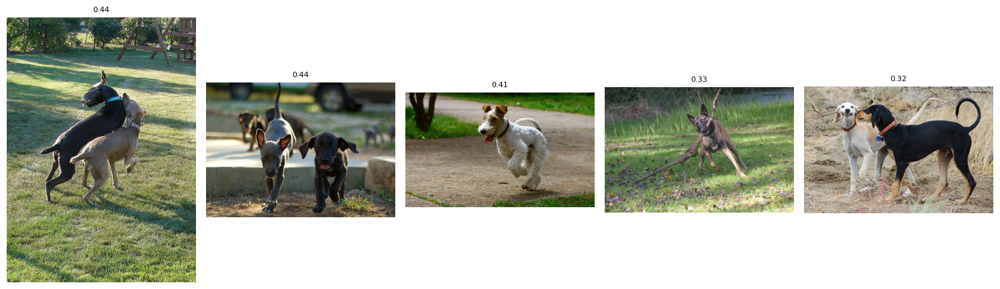

In [148]:
show_random_result(mlp, sbert_model, top_k=5)

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

SBERT SentenceTransformer(
  (0): Transformer({'max_seq_length': 128, 'do_lower_case': False, 'architecture': 'BertModel'})
  (1): Pooling({'word_embedding_dimension': 384, 'pooling_mode_cls_token': False, 'pooling_mode_mean_tokens': True, 'pooling_mode_max_tokens': False, 'pooling_mode_mean_sqrt_len_tokens': False, 'pooling_mode_weightedmean_tokens': False, 'pooling_mode_lasttoken': False, 'include_prompt': True})
) трансформация: shape=(1, 384), dtype=float32
Query: a brown and white dog standing on the street wearing a hat , shirt and jeans .
1. 1745110280_0cbff5e273.jpg — 0.002
2. 381514859_b40418d9c3.jpg — 0.001
3. 1319634306_816f21677f.jpg — 0.001
4. 3262849619_0bc4f88ef9.jpg — 0.001
5. 957682378_46c3b07bcd.jpg — 0.001


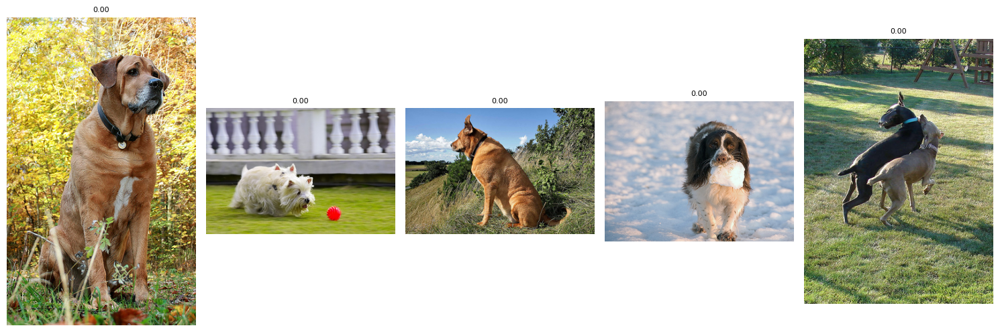

In [149]:
show_random_result(mlp, sbert_model, top_k=5)

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

SBERT SentenceTransformer(
  (0): Transformer({'max_seq_length': 128, 'do_lower_case': False, 'architecture': 'BertModel'})
  (1): Pooling({'word_embedding_dimension': 384, 'pooling_mode_cls_token': False, 'pooling_mode_mean_tokens': True, 'pooling_mode_max_tokens': False, 'pooling_mode_mean_sqrt_len_tokens': False, 'pooling_mode_weightedmean_tokens': False, 'pooling_mode_lasttoken': False, 'include_prompt': True})
) трансформация: shape=(1, 384), dtype=float32
Query: A black and white dog with a green collar stands in front of a sign .
1. 1468389504_c724bdcad0.jpg — 0.031
2. 3154152744_4e93ec8a62.jpg — 0.015
3. 3211199368_ca78387f72.jpg — 0.008
4. 3553476195_fb3747d7c1.jpg — 0.008
5. 2709359730_13bca100af.jpg — 0.003


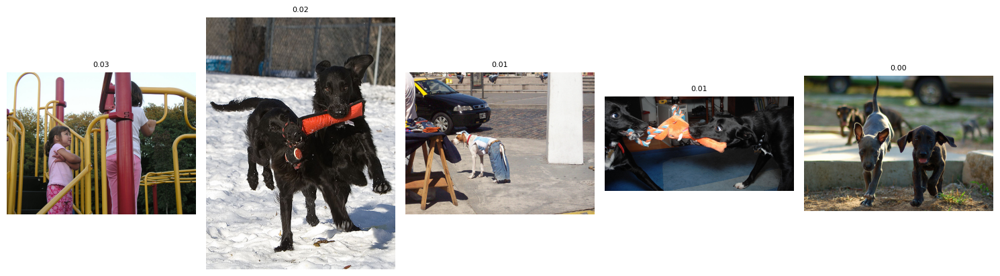

In [150]:
show_random_result(mlp, sbert_model, top_k=5)

По визуальному осмотру результаты получились противоречивые. Какие-то запросы определяются хорошо, другие совсем не связаны с картинками.

# Вывод

- Подготовили данные: проверили схемы, нашли и обработали пропуски (share_confirmed: 41 970, count_confirmed: 41 970, count_rejected: 1 323), дубликатов нет, в остальных датасетах пропусков нет.

- Объединили оценки крауда и экспертов с тренировочным набором, заполнили/удалили пропуски в таргете, обнаружили сильный дисбаланс классов.

- Очистили выборку от нежелательного контента (дети), визуально проверили результат.

- Построили признаки: эмбеддинги изображений (ResNet50), текстов (TF-IDF, Word2Vec, SBERT). Сконкатенировали img+text, таргет бинаризовали.

- Обучили 4 модели (LogReg, LGBM, CatBoost, MLP) на 3 фичсетах (TFIDF+IMG, W2V+IMG, SBERT+IMG). Основные метрики — ROC-AUC и precision/recall по классам.

- Лучший вариант: MLP + SBERT+IMG с метриками ROC-AUC=0.781 | P1=0.188 R1=0.501 | P0=0.965 R0=0.865.

- Тест-драйв: по визуальному осмотру выдачи для случайных запросов изображения соответствуют частично.

Вывод: демонстрационная версия готова но определяет изображение по запросу не всегда хорошо.